# Linear Mixed-Effects Models

#### Config

In [1]:
import os
import sys
from pathlib import Path
import re

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import linregress
from patsy import bs
%matplotlib inline

# Add src to path
project_root = Path(os.path.abspath('')).parent.parent
src_path = project_root / "exploration" / "pesabrain-hemodynamic-modeling" / "auxilirary"
if str(src_path) not in sys.path:
    sys.path.insert(0, str(src_path))


print(f"Project root: {project_root}")
print(f"Source path: {src_path}")

# Analysis
from analysis_plotting import (
    load_all_patients,
    load_clinical_summary
)
from correlater import (
    build_analysis_database,
    load_analysis_database,
    save_correlation_heatmaps,
    save_standard_scatter_plots,
    save_hued_scatter_plots,
    save_vessel_spatial_correlation_outputs,
    save_polar_clinical_correlations,
    save_flow_pi_cross_correlation,
    _save_mixed_effects_by_vessel_plots,
    _coerce_clinical_numeric,
    _select_numeric_clinical_columns
)

from plotter import (
    load_patient_metadata,
    extract_flow_timeseries_from_mat,
    _VESSEL_CODE_TO_NAME,
)

Project root: /home/imarcoss/nvitk/notebooks
Source path: /home/imarcoss/nvitk/notebooks/exploration/pesabrain-hemodynamic-modeling/auxilirary


/home/imarcoss/nvitk/notebooks/exploration/pesabrain-hemodynamic-modeling/auxilirary/plotter.py:51: UserWarning: h5py not available. Cannot load MATLAB v7.3 files. Install with: pip install h5py
  warnings.warn("h5py not available. Cannot load MATLAB v7.3 files. Install with: pip install h5py")


In [12]:
# Configuration Dirs
RESULTS_DIR = Path("/data_lab_MCC/imarcoss/LabMCC/RESULTS/QVTPlus/")
CLINICAL_SUMMARY = Path("/data_local/LabVF/PESA-Brain/Auxiliary/PESABrain_DB_Batch1.xlsx")
DATABASE_PATH = Path('/home/imarcoss/NetVolumes/Tierra/LAB_VF-ICH/LAB/MCC LAB/_IgnacioMarcos/LabVF/PESA-Brain/DB/auxiliary/4dflowsv2//PESABrain_AnalysisDB_Batch1.csv') 
TEMPORAL_FLOW_LONG_PATH = DATABASE_PATH.with_name(DATABASE_PATH.stem + "_flow_timeseries.csv")
TEMPORAL_FLOW_WIDE_PATH = DATABASE_PATH.with_name(DATABASE_PATH.stem + "_flow_timeseries_w.csv")
MODELS_DIR = Path('/data_local/LabVF/PESA-Brain/RESULTS/Preliminary B1/clinical/mm_models/V2/')
if not MODELS_DIR.exists():
    MODELS_DIR.mkdir(parents=True, exist_ok=True)

OUTPUT_DIR = Path('/data_local/LabVF/PESA-Brain/RESULTS/Preliminary B1/clinical/')

# Configuration Vars
SIGMA_THRESHOLD = None   # 6.0

_REMAKE_DB = False
_REMAKE_DYNAMIC_DB = True

print(f"Results directory: {RESULTS_DIR}")
print(f"Clinical summary: {CLINICAL_SUMMARY}")
print(f"Output directory: {OUTPUT_DIR}")
print(f"Database path: {DATABASE_PATH}")

Results directory: /data_lab_MCC/imarcoss/LabMCC/RESULTS/QVTPlus
Clinical summary: /data_local/LabVF/PESA-Brain/Auxiliary/PESABrain_DB_Batch1.xlsx
Output directory: /data_local/LabVF/PESA-Brain/RESULTS/Preliminary B1/clinical
Database path: /home/imarcoss/NetVolumes/Tierra/LAB_VF-ICH/LAB/MCC LAB/_IgnacioMarcos/LabVF/PESA-Brain/DB/auxiliary/4dflowsv2/PESABrain_AnalysisDB_Batch1.csv


### 1. Database Build/Save

#### -Static Database

In [10]:
patients2exclude = ['PESA15808576']

if not DATABASE_PATH.exists() or _REMAKE_DB:
    print("Building analysis database (this may take a while)...")
    print("Loading patient data...")
    patient_data, _ = load_all_patients(RESULTS_DIR)
    print(f"Found {len(patient_data)} patients")
    
    print("Loading clinical summary...")
    clinical_df = load_clinical_summary(CLINICAL_SUMMARY)
    print(f"Clinical data shape: {clinical_df.shape}")
    
    print("Building consolidated database...")
    database_df = build_analysis_database(
        patient_metadata=patient_data,
        clinical_df=clinical_df,
        output_path=DATABASE_PATH,
        patients2exclude=patients2exclude
    )
    print("✓ Database created successfully!")
else:
    print(f"✓ Database already exists at: {DATABASE_PATH}")
    
    # Load the database
    clinical_df, flow_table, pi_table = load_analysis_database(DATABASE_PATH)

    # Remove TCBF for PI if present
    if "TCBF" in pi_table.columns:
        pi_table = pi_table.drop(columns=["TCBF"])

    print(f"\nLoaded data:")
    print(f"  Clinical: {clinical_df.shape}")
    print(f"  Flow: {flow_table.shape}")
    print(f"  PI: {pi_table.shape}")

    # Display first few rows
    print(f"\nClinical columns: {list(clinical_df.columns[:10])}...")
    print(f"\nFlow vessels: {list(flow_table.columns[:5])}...")
    print(f"\nPI vessels: {list(pi_table.columns[:5])}...")

✓ Database already exists at: /home/imarcoss/NetVolumes/Tierra/LAB_VF-ICH/LAB/MCC LAB/_IgnacioMarcos/LabVF/PESA-Brain/DB/auxiliary/4dflowsv2/PESABrain_AnalysisDB_Batch1.csv
Loaded database: 393 patients
Clinical variables: 17
Flow vessels: 16
PI vessels: 15

Loaded data:
  Clinical: (393, 18)
  Flow: (393, 17)
  PI: (393, 16)

Clinical columns: ['patient_id', 'sex', 'age_at_mri', 'weight', 'height', 'bpxsym', 'bpxdim', 'bpxpls', 'hematocrit', 'tas']...

Flow vessels: ['patient_id', 'Left ICA', 'Right ICA', 'Basilar', 'Left MCA']...

PI vessels: ['patient_id', 'Left ICA', 'Right ICA', 'Basilar', 'Left MCA']...


#### -Dynamic Database

In [4]:
# Only process patients present in the main (time-averaged) DB
MAIN_DB_PATIENT_IDS = set(clinical_df["patient_id"].astype(str).tolist())

if (not TEMPORAL_FLOW_LONG_PATH.exists()) or _REMAKE_DYNAMIC_DB:
    print("Building temporal flow DB (15-frame waveforms) — this may take a while...")

    patient_dirs = [
        p
        for p in RESULTS_DIR.iterdir()
        if p.is_dir() and p.name.upper().startswith("PESA") and (p.name in MAIN_DB_PATIENT_IDS)
    ]
    patient_dirs = sorted(patient_dirs, key=lambda p: p.name)

    rows = []
    n_ok = 0
    n_fail = 0

    for i, pdir in enumerate(patient_dirs, start=1):
        pid = pdir.name
        try:
            md = load_patient_metadata(pdir)
            locs = md.get("LOCs", {})
            if not locs:
                n_fail += 1
                continue

            flow_ts = extract_flow_timeseries_from_mat(pdir, locs)
            if not flow_ts:
                n_fail += 1
                continue

            for code, arr in flow_ts.items():
                vessel_name = _VESSEL_CODE_TO_NAME.get(code, code)
                arr = np.asarray(arr, dtype=float)

                # Enforce 15 frames (0..14). If an input has 16 samples, keep the first 15.
                if arr.size >= 15:
                    arr = arr[:15]

                for t, v in enumerate(arr.tolist()):
                    rows.append(
                        {
                            "patient_id": pid,
                            "vessel": vessel_name,
                            "vessel_code": code,
                            "frame": int(t),
                            "flow": float(v),
                        }
                    )

            n_ok += 1
        except Exception:
            n_fail += 1

        if i % 25 == 0:
            print(f"  processed {i}/{len(patient_dirs)} patients...")

    flow_ts_long = pd.DataFrame(rows)
    TEMPORAL_FLOW_LONG_PATH.parent.mkdir(parents=True, exist_ok=True)
    flow_ts_long.to_csv(TEMPORAL_FLOW_LONG_PATH, index=False)

    print("✓ Saved temporal flow DB:", TEMPORAL_FLOW_LONG_PATH)
    print("Patients OK:", n_ok, "Failed/skipped:", n_fail)
    print("Rows:", len(flow_ts_long))

    flow_ts_long["patient_id"] = flow_ts_long["patient_id"].astype(str)
    flow_ts_long["frame"] = pd.to_numeric(flow_ts_long["frame"], errors="coerce").astype(int)
    flow_ts_long["flow"] = pd.to_numeric(flow_ts_long["flow"], errors="coerce")

    # Keep only frames 0..14 
    flow_ts_long = flow_ts_long[flow_ts_long["frame"].between(0, 14)].copy()

    # Keep only patients from main DB 
    flow_ts_long = flow_ts_long[flow_ts_long["patient_id"].isin(MAIN_DB_PATIENT_IDS)].copy()

    # Attach clinical vars for Step 15
    flow_ts_long = flow_ts_long.merge(clinical_df, on="patient_id", how="left")

    # Validate the "always 15 frames" assumption (and enforce if needed)
    STRICT_15_FRAMES = True
    EXPECTED_NFRAMES = 15

    nframes = flow_ts_long.groupby(["patient_id", "vessel"])["frame"].nunique().reset_index(name="nframes")
    print("nframes distribution (patient×vessel):")
    print(nframes["nframes"].value_counts().sort_index())

    if STRICT_15_FRAMES:
        bad = nframes[nframes["nframes"] != EXPECTED_NFRAMES]
        if len(bad) > 0:
            print(f"Warning: found {len(bad)} patient×vessel waveforms with nframes != {EXPECTED_NFRAMES}. They will be dropped.")
            keep_keys = nframes.loc[nframes["nframes"] == EXPECTED_NFRAMES, ["patient_id", "vessel"]].copy()
            flow_ts_long = flow_ts_long.merge(keep_keys, on=["patient_id", "vessel"], how="inner")

    # Add normalized phase coordinate [0,1]
    flow_ts_long["phase"] = flow_ts_long["frame"] / float(EXPECTED_NFRAMES - 1)

    # Add TCBF if missing: per patient×frame sum of (LICA + RICA + Basilar)
    if "TCBF" not in set(flow_ts_long["vessel"].dropna().unique()):
        wide_pf = flow_ts_long.pivot_table(index=["patient_id", "frame"], columns="vessel", values="flow", aggfunc="mean")
        needed = ["Left ICA", "Right ICA", "Basilar"]
        if all(v in wide_pf.columns for v in needed):
            tcbf = wide_pf[needed].sum(axis=1, min_count=len(needed))  # NaN unless all three present
            tcbf = tcbf.reset_index().rename(columns={0: "flow"})
            tcbf["vessel"] = "TCBF"
            tcbf["vessel_code"] = "TCBF"

            # Attach the rest of the patient-level columns (clinical vars)
            tcbf = tcbf.merge(clinical_df, on="patient_id", how="left")

            # Align columns with flow_ts_long (keep any common + core columns)
            base_cols = ["patient_id", "vessel", "vessel_code", "frame", "flow"]
            other_cols = [c for c in flow_ts_long.columns if c not in base_cols]
            tcbf = tcbf[base_cols + [c for c in other_cols if c in tcbf.columns]]

            flow_ts_long = pd.concat([flow_ts_long, tcbf], ignore_index=True)
            print("✓ Added TCBF temporal waveform as LICA+RICA+Basilar (per frame)")
        else:
            print("Warning: cannot build TCBF (missing one of Left ICA / Right ICA / Basilar in temporal data)")

    # Sanity + unit alignment: dynamic waveform mean vs time-averaged DB value
    flow_ts_mean = (
        flow_ts_long.groupby(["patient_id", "vessel"], as_index=False)["flow"].mean().rename(columns={"flow": "flow_wave_mean_raw"})
    )
    flow_avg_long = flow_table.melt(id_vars=["patient_id"], var_name="vessel", value_name="flow_avg")
    flow_avg_long["patient_id"] = flow_avg_long["patient_id"].astype(str)
    flow_avg_long["flow_avg"] = pd.to_numeric(flow_avg_long["flow_avg"], errors="coerce")

    chk = flow_ts_mean.merge(flow_avg_long, on=["patient_id", "vessel"], how="inner").dropna(subset=["flow_wave_mean_raw", "flow_avg"])

    # Estimate scaling factor to bring waveform units to mL/min
    scale = 1.0
    if len(chk) >= 50:
        tmp = chk.copy()
        tmp = tmp[(tmp["flow_wave_mean_raw"].abs() > 1e-6) & np.isfinite(tmp["flow_avg"]) & np.isfinite(tmp["flow_wave_mean_raw"])]
        if len(tmp) >= 50:
            ratio = (tmp["flow_avg"] / tmp["flow_wave_mean_raw"]).replace([np.inf, -np.inf], np.nan).dropna()
            if len(ratio) >= 50:
                scale_med = float(np.nanmedian(ratio))
                # Heuristic: if scale ~60, waveform was likely in mL/s
                if 50.0 <= scale_med <= 70.0:
                    scale = scale_med
                else:
                    scale = 1.0

    if scale != 1.0:
        print(f"Detected waveform scaling ~{scale:.3g}. Converting dynamic flow to mL/min (flow *= {scale:.3g}).")
        flow_ts_long["flow"] = flow_ts_long["flow"] * scale
    else:
        print("No waveform scaling applied (assuming dynamic flow already in mL/min).")

    # Resave
    flow_ts_long.to_csv(TEMPORAL_FLOW_LONG_PATH, index=False)
    # Recompute sanity after scaling
    flow_ts_mean2 = (
        flow_ts_long.groupby(["patient_id", "vessel"], as_index=False)["flow"].mean().rename(columns={"flow": "flow_wave_mean"})
    )
    chk2 = flow_ts_mean2.merge(flow_avg_long, on=["patient_id", "vessel"], how="inner").dropna(subset=["flow_wave_mean", "flow_avg"])
    if len(chk2) >= 10:
        r = float(np.corrcoef(chk2["flow_wave_mean"], chk2["flow_avg"])[0, 1])
        print("Sanity Pearson r (wave mean vs DB avg):", r)
    else:
        print("Sanity check skipped (insufficient overlap).")
else:
    print("✓ Temporal flow DB already exists:", TEMPORAL_FLOW_LONG_PATH)
    TEMPORAL_FLOW_LONG_PATH = DATABASE_PATH.with_name(DATABASE_PATH.stem + "_flow_timeseries.csv")
    flow_ts_long = pd.read_csv(TEMPORAL_FLOW_LONG_PATH)
    print(flow_ts_long.head())

Building temporal flow DB (15-frame waveforms) — this may take a while...


✓ Saved temporal flow DB: /home/imarcoss/NetVolumes/Tierra/LAB_VF-ICH/LAB/MCC LAB/_IgnacioMarcos/LabVF/PESA-Brain/DB/auxiliary/4dflowsv2/PESABrain_AnalysisDB_Batch1_flow_timeseries.csv
Patients OK: 0 Failed/skipped: 392
Rows: 0


KeyError: 'patient_id'

In [ ]:
clinical_cols = [
    'patient_id', 'vessel', 'vessel_code', 'age_at_mri', 'sex', 'bmi', 
    'weight', 'height', 'hematocrit', 'bpxsym', 'bpxdim', 'bpxpls', 
    'tas', 'tad', 'sys_dias_delta', 'plaque_right_carotid', 'plaque_left_carotid',
    'ctx_right_hemisphere', 'ctx_left_hemisphere', 'ctx_whole_brain'
]

flow_ts_wide = flow_ts_long.pivot_table(
    index=clinical_cols, 
    columns='frame', 
    values='flow',
    # aggfunc='mean' 
).reset_index()

flow_ts_wide.to_csv(TEMPORAL_FLOW_WIDE_PATH, index=False)

NameError: name 'flow_ts_long' is not defined

### 2. Static Models

- Index:
    - Aging Model:               
    Flow ~ 1 + age_c + sex + (1 + age_c|vessel) + (1|participant)
    - Aging Model + Hematocrite: 
    Flow ~ 1 + age_c + sex + hematocrite + (1 + age_c|vessel) + (1|participant)
    - Aging Model | B-Spline:    
    Flow ~ 1 + bs(age_c) + sex + (1 + bs(age_c)|vessel) + (1|participant)

    - ASL Perfusion:             
    Flow ~ 1 + ASLwb + age_c + sex + (1|vessel) + (1|participant)
    - ASL Perfusion | H-Split:   
    Flow ~ 1 + ASLlh + age_c + sex + (1|vessel_lh) + (1|participant)
    Flow ~ 1 + ASLrh + age_c + sex + (1|vessel_rh) + (1|participant)
    - ASL Perfusion | H-Aware:   
    Flow ~ 1 + ASLh + age_c + sex + (1|vessel) + (1|participant)

    - Plaque | ICAs:
    Flow_lica ~ 1 + PLClc + age_c + sex + (1|participant)
    Flow_rica ~ 1 + PLCrc + age_c + sex + (1|participant)
    - Plaque | H-Aware:          
    Flow ~ 1 + PLCany + PLCvol + age_c + sex + (1|vessel) + (1|participant)
    

Helpers

In [5]:
def _safe_col(name: str) -> str:
    """Make column names formula-safe for patsy/statsmodels."""
    return re.sub(r"[^0-9a-zA-Z_]+", "_", name)


def _map_sex_to_numeric(s: pd.Series) -> pd.Series:
    # Accept already-numeric 0/1
    if pd.api.types.is_numeric_dtype(s):
        return pd.to_numeric(s, errors="coerce")

    ss = s.astype(str).str.strip().str.lower()
    mapping = {
        "male": 1,
        "m": 1,
        "1": 1,
        "female": 0,
        "f": 0,
        "0": 0,
        1: 1,
        0: 0,
        1.0: 1,
        0.0: 0,
    }
    out = ss.map(mapping)
    return pd.to_numeric(out, errors="coerce")


def build_long_vessel_df(
    clinical_df_in: pd.DataFrame,
    feature_table_in: pd.DataFrame,
    *,
    outcome_label: str,
    exclude_vessels: set[str] | None = None,
    column_names: list[str] | None = None,
) -> pd.DataFrame:
    """Return long df with columns: patient_id, vessel, value, age, sex."""
    exclude_vessels = exclude_vessels or set()

    # Safe column names for modeling
    clinical_df = clinical_df_in.copy()
    clinical_df.columns = [_safe_col(c) for c in clinical_df.columns]

    feature_table = feature_table_in.copy()
    feature_table.columns = [_safe_col(c) for c in feature_table.columns]

    if "patient_id" not in clinical_df.columns:
        raise ValueError("clinical_df must include patient_id")
    if "patient_id" not in feature_table.columns:
        raise ValueError("feature_table must include patient_id")

    # Melt vessels
    vessel_cols = [c for c in feature_table.columns if c != "patient_id" and c not in {_safe_col(v) for v in exclude_vessels}]
    long = feature_table.melt(id_vars=["patient_id"], value_vars=vessel_cols, var_name="vessel", value_name="value")

    # Join clinical
    if column_names is None: column_names = ["patient_id", "age_at_mri", "sex"]
    keep_cols = [c for c in column_names if c in clinical_df.columns]
    if "age_at_mri" not in keep_cols:
        raise ValueError("clinical_df must include age_at_mri")
    if "sex" not in keep_cols:
        raise ValueError("clinical_df must include sex")

    merged = long.merge(clinical_df[keep_cols], on="patient_id", how="inner")

    merged = merged.rename(columns={"age_at_mri": "age"})
    if 'age_at_mri' in column_names: 
        column_names.remove('age_at_mri')
        column_names.append('age')
    merged["sex"] = _map_sex_to_numeric(merged["sex"])

    # Clean
    merged["value"] = pd.to_numeric(merged["value"], errors="coerce")
    merged["age"] = pd.to_numeric(merged["age"], errors="coerce")

    merged = merged.dropna(subset=column_names + ["value"]).copy()

    # Center age for numerical stability (does not change slopes, only intercept meaning)
    merged["age_c"] = merged["age"] - float(merged["age"].mean())

    merged["outcome"] = outcome_label

    return merged


VESSEL_GROUPS_ORDER = {
    "Internal Carotid Arteries": ["Left_ICA", "Right_ICA"],
    "Venous Drainage": ["Sagital_Sinus", "Straight_Sinus", "Left_Transverse", "Right_Transverse"],
    "Anterior Circulation": [
        "Left_MCA",
        "Right_MCA",
        "Left_ACA",
        "Right_ACA",
        "Left_Communicating",
        "Right_Communicating",
    ],
    "Posterior Circulation": ["Basilar", "Left_PCA", "Right_PCA"],
}

VESSEL_GROUPS_ORDER_BY_CODE = {
    "Internal Carotid Arteries": ["LICA", "RICA"],
    "Venous Drainage": ["SSSV", "STRV", "LTSV", "RTSV"],
    "Anterior Circulation": [
        "LMCA",
        "RMCA",
        "LACA",
        "RACA",
        "LCOM",
        "RCOM",
    ],
    "Posterior Circulation": ["BASI", "LPCA", "RPCA"],
}

def fit_or_load_mixedlm(path: Path, fit_fn, load_fn=None, overwrite=False, **kwargs):
    path.parent.mkdir(parents=True, exist_ok=True)
    if path.exists() and not overwrite:
        if load_fn is None:
            from statsmodels.regression.mixed_linear_model import MixedLMResults
            print(f"Loading model from {path}")
            return MixedLMResults.load(path)
        else:
            print(f"Loading model from {path} using {load_fn.__name__}")
            return load_fn(path, **kwargs)
    print(f"Fitting model and saving to {path}")
    res, df = fit_fn(**kwargs)
    res.save(path)
    return res, df

#### 2.1. Flow ~ 1 + age_c + sex + (1 + age_c|vessel) + (1|participant)

Methodology

In [6]:

from statsmodels.regression.mixed_linear_model import MixedLMResults


def _fit_paper_mixedlm(long_df: pd.DataFrame, *, outcome: str, model_path: Path = None):
    """Paper models (crossed random effects) implemented in statsmodels.

    Paper equations:
    - Flow: flow ~ 1 + age + sex + (1 + age | vessel) + (1 | participant)
    - PI:   log(PI) ~ 1 + age + sex + (1 + age | vessel) + (1 | participant)

    Implementation in statsmodels (approx. crossed RE):
    - groups = vessel, re_formula = "1 + age_c"        -> (1 + age | vessel)
    - vc_formula for participant intercepts             -> (1 | participant)

    Returns:
    - res: MixedLMResults
    - df_fit: the exact dataframe used for fitting (includes y)
    """
    import warnings

    from statsmodels.regression.mixed_linear_model import MixedLM
    from statsmodels.tools.sm_exceptions import ConvergenceWarning

    df = long_df.copy().reset_index(drop=True)
    df = df.dropna(subset=["patient_id", "vessel", "age", "age_c", "sex", "value"]).reset_index(drop=True)

    # Outcome
    if outcome.lower() == "flow":
        df["y"] = pd.to_numeric(df["value"], errors="coerce")
        y_label = "Flow (mL/min)"
    elif outcome.lower() in {"pi_log", "log_pi", "pi"}:
        df["value"] = pd.to_numeric(df["value"], errors="coerce")
        df = df.dropna(subset=["value"]).copy()
        df = df[df["value"] > 0].copy()
        df["y"] = np.log(df["value"].astype(float))
        y_label = "log(PI)"
    else:
        raise ValueError("outcome must be 'flow' or 'pi_log'")

    # Stable vessel categories
    vessels = sorted(df["vessel"].unique())
    df["vessel"] = pd.Categorical(df["vessel"], categories=vessels)

    # Fixed effects
    formula = "y ~ 1 + age_c + sex"

    # Random effects: (1 + age_c | vessel) + (1 | participant)
    vc = {"participant": "0 + C(patient_id)"}

    model = MixedLM.from_formula(
        formula,
        groups=df["vessel"],
        re_formula="1 + age_c",
        vc_formula=vc,
        data=df,
    )

    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=UserWarning, module="statsmodels")
        warnings.filterwarnings("ignore", category=RuntimeWarning, module="statsmodels")
        warnings.filterwarnings("ignore", category=ConvergenceWarning, module="statsmodels")
        res = model.fit(reml=True, method="lbfgs", maxiter=1200)

    try:
        y_hat = res.predict(df)
        print(f"Sanity [{y_label}]: obs_mean={float(np.nanmean(df['y'])):.3g} pred_mean={float(np.nanmean(y_hat)):.3g}")
    except Exception:
        pass

    if model_path is not None:
        print(f"Saving model to {model_path}")
        res.save(model_path)

    return res, df


def _load_paper_mixedlm(model_path: Path, *, outcome: str, long_df: pd.DataFrame=None):
    from statsmodels.regression.mixed_linear_model import MixedLM
    
    if long_df is not None:
        df = long_df.copy().reset_index(drop=True)
        df = df.dropna(subset=["patient_id", "vessel", "age", "age_c", "sex", "value"]).reset_index(drop=True)

        # Outcome
        if outcome.lower() == "flow":
            df["y"] = pd.to_numeric(df["value"], errors="coerce")
        elif outcome.lower() in {"pi_log", "log_pi", "pi"}:
            df["value"] = pd.to_numeric(df["value"], errors="coerce")
            df = df.dropna(subset=["value"]).copy()
            df = df[df["value"] > 0].copy()
            df["y"] = np.log(df["value"].astype(float))
        else:
            raise ValueError("outcome must be 'flow' or 'pi_log'")

        # Stable vessel categories
        vessels = sorted(df["vessel"].unique())
        df["vessel"] = pd.Categorical(df["vessel"], categories=vessels)

        # # Fixed effects
        # formula = "y ~ 1 + age_c + sex"

        # # Random effects: (1 + age_c | vessel) + (1 | participant)
        # vc = {"participant": "0 + C(patient_id)"}

        # model = MixedLM.from_formula(
        #     formula,
        #     groups=df["vessel"],
        #     re_formula="1 + age_c",
        #     vc_formula=vc,
        #     data=df,
        # )
        # res = model.load(model_path)
        model = MixedLMResults.load(model_path)
        return model, df

    model = MixedLMResults.load(model_path)
    return model



Visualization

In [7]:
def plot_paper_conditional_fits_by_group(
    df_fit: pd.DataFrame,
    res,
    *,
    output_path: Path,
    title: str,
    y_label: str,
    sex_ref: str = "mean",
):
    """Replicate paper Fig5/Fig6 style using crossed random effects.

    Model-implied lines:
    - Colored: conditional vessel fits = fixed effects + vessel random effects (BLUPs)
    - Black: fixed effect only (population average)

    Participant random intercepts are *not* drawn (paper shows vessel lines + fixed line).
    """

    output_path.parent.mkdir(parents=True, exist_ok=True)

    if sex_ref == "mean":
        sex_val = float(pd.to_numeric(df_fit["sex"], errors="coerce").mean())
    elif sex_ref == "female":
        sex_val = 0.0
    elif sex_ref == "male":
        sex_val = 1.0
    else:
        raise ValueError("sex_ref must be one of: mean, female, male")

    ages = pd.to_numeric(df_fit["age"], errors="coerce").to_numpy()
    ages = ages[np.isfinite(ages)]
    x_line = np.linspace(float(np.nanmin(ages)), float(np.nanmax(ages)), 200)

    # Use the fit's centering constant for age_c
    try:
        age_mean_fit = float(np.nanmean(pd.to_numeric(res.model.data.frame["age"], errors="coerce")))
    except Exception:
        age_mean_fit = float(np.nanmean(pd.to_numeric(df_fit["age"], errors="coerce")))

    x_line_c = x_line - age_mean_fit

    fe = res.fe_params
    b0 = float(fe.get("Intercept", fe.get("const", 0.0)))
    b_age = float(fe.get("age_c", 0.0))
    b_sex = float(fe.get("sex", 0.0))

    # Fixed-effect line
    y_fixed = b0 + b_age * x_line_c + b_sex * sex_val

    try:
        p_age = float(res.pvalues.get("age_c", np.nan))
        p_sex = float(res.pvalues.get("sex", np.nan))
    except Exception:
        p_age = np.nan
        p_sex = np.nan

    vessels_all = sorted(df_fit["vessel"].unique())

    fig, axes = plt.subplots(2, 2, figsize=(18, 12), sharex=True, sharey=False)
    axes = axes.flatten()

    for ax, (group_name, vessels) in zip(axes, VESSEL_GROUPS_ORDER.items()):
        vessels_present = [v for v in vessels if v in set(vessels_all)]
        if not vessels_present:
            ax.axis("off")
            continue

        palette = sns.color_palette("husl", n_colors=len(vessels_present))

        for i, v in enumerate(vessels_present):
            sub = df_fit[df_fit["vessel"] == v]
            ax.scatter(sub["age"], sub["y"], s=12, alpha=0.7, color=palette[i])

            # Vessel BLUPs (random intercept + random age slope)
            re = res.random_effects.get(v, None)
            if re is None and isinstance(v, str):
                re = res.random_effects.get(str(v), None)

            re_int = 0.0
            re_age = 0.0
            if re is not None:
                try:
                    # statsmodels typically uses 'Group' for intercept
                    re_int = float(re.get("Group", re.iloc[0]))
                except Exception:
                    try:
                        re_int = float(re.iloc[0])
                    except Exception:
                        re_int = 0.0
                try:
                    re_age = float(re.get("age_c", re.iloc[1] if len(re) > 1 else 0.0))
                except Exception:
                    re_age = 0.0

            y_v = (b0 + re_int) + (b_age + re_age) * x_line_c + b_sex * sex_val
            ax.plot(x_line, y_v, color=palette[i], linewidth=3, alpha=1, label=v)

        ax.plot(
            x_line,
            y_fixed,
            color="black",
            linewidth=3.7,
            linestyle="--",
            label=f"Fixed effect (age_c p={p_age:.2g}, sex p={p_sex:.2g})",
        )

        ax.set_title(group_name, fontsize=13, fontweight="bold")
        ax.set_xlabel("Age")
        ax.set_ylabel(y_label)
        ax.grid(True, alpha=0.25)
        ax.legend(loc="best", fontsize=11)

    fig.suptitle(f"{title} (sex_ref={sex_ref})", fontsize=15, fontweight="bold")
    fig.tight_layout()
    fig.savefig(output_path, dpi=300, bbox_inches="tight")
    plt.close(fig)


def plot_paper_random_effects_by_vessel(
    df_fit: pd.DataFrame,
    res,
    *,
    output_path: Path,
    title: str,
    y_label: str,
    group_name: str = "vessel",
    age_var: str = "age",
    age_c_var: str = "age_c",
    sex_ref: str = "mean",
):
    """
    Create paper-style random effects plot showing vessel intercepts and age slopes.
    
    This creates a two-panel plot:
    1. Top panel: Vessel random intercepts (absolute values: fixed + random)
    2. Bottom panel: Vessel random age slopes (absolute values: fixed + random)
    
    Parameters:
    -----------
    df_fit : pd.DataFrame
        Dataframe used for fitting
    res : MixedLMResults
        Fitted mixed linear model results
    output_path : Path
        Path to save the figure
    title : str
        Title for the plot
    y_label : str
        Label for y-axis units (e.g., "mL/min", "au")
    group_name : str
        Name of the grouping variable (e.g., "vessel")
    age_var : str
        Name of age variable (uncentered)
    age_c_var : str
        Name of centered age variable
    sex_ref : str
        Reference sex value: "mean", "female", or "male"
    """
    output_path.parent.mkdir(parents=True, exist_ok=True)
    
    # Get fixed effects
    fe = res.fe_params
    b0 = float(fe.get("Intercept", fe.get("const", 0.0)))
    b_age = float(fe.get(age_c_var, fe.get("age_c", 0.0)))
    b_sex = float(fe.get("sex", 0.0))
    
    # Get sex reference value
    if sex_ref == "mean":
        sex_val = float(pd.to_numeric(df_fit["sex"], errors="coerce").mean())
    elif sex_ref == "female":
        sex_val = 0.0
    elif sex_ref == "male":
        sex_val = 1.0
    else:
        sex_val = float(pd.to_numeric(df_fit["sex"], errors="coerce").mean())
    
    # Get age mean for fixed effect calculation
    try:
        age_mean_fit = float(np.nanmean(pd.to_numeric(res.model.data.frame[age_var], errors="coerce")))
    except Exception:
        age_mean_fit = float(np.nanmean(pd.to_numeric(df_fit[age_var], errors="coerce")))
    
    # Extract random effects (BLUPs) for vessels
    re_dict = res.random_effects if hasattr(res, 'random_effects') else {}
    vessel_names = sorted(df_fit[group_name].unique())
    
    # Extract vessel-specific random intercepts and slopes (these are DEVIATIONS from fixed effects)
    vessel_re_intercepts = {}  # Random effects (deviations)
    vessel_re_slopes = {}      # Random effects (deviations)
    
    for vessel in vessel_names:
        re = re_dict.get(vessel, None)
        if re is None and isinstance(vessel, str):
            re = re_dict.get(str(vessel), None)
        
        re_int = 0.0
        re_age = 0.0
        
        if re is not None:
            try:
                if isinstance(re, pd.Series):
                    if len(re) >= 1:
                        re_int = float(re.iloc[0])
                    if len(re) >= 2:
                        re_age = float(re.iloc[1])
                elif isinstance(re, pd.DataFrame):
                    if 'Group' in re.columns or 'Intercept' in re.columns:
                        re_int = float(re.iloc[0, 0])
                    if age_c_var in re.columns or 'age_c' in re.columns:
                        re_age = float(re.iloc[0, 1] if re.shape[1] > 1 else 0.0)
                    elif re.shape[1] >= 2:
                        re_int = float(re.iloc[0, 0])
                        re_age = float(re.iloc[0, 1])
                else:
                    re_array = np.array(re).flatten()
                    if len(re_array) >= 1:
                        re_int = float(re_array[0])
                    if len(re_array) >= 2:
                        re_age = float(re_array[1])
            except Exception:
                pass
        
        vessel_re_intercepts[vessel] = re_int  # This is the deviation
        vessel_re_slopes[vessel] = re_age      # This is the deviation
    
    # Calculate ABSOLUTE intercepts and slopes (fixed + random)
    # For intercepts: absolute intercept = fixed intercept + random intercept deviation
    # At reference age (mean age, where age_c = 0) and reference sex
    fixed_intercept_at_ref = b0 + b_age * 0.0 + b_sex * sex_val  # Fixed intercept at mean age
    
    vessel_absolute_intercepts = {}
    vessel_absolute_slopes = {}
    
    for vessel in vessel_names:
        # Absolute intercept = fixed intercept + random intercept deviation
        vessel_absolute_intercepts[vessel] = fixed_intercept_at_ref + vessel_re_intercepts.get(vessel, 0.0)
        # Absolute slope = fixed slope + random slope deviation
        vessel_absolute_slopes[vessel] = b_age + vessel_re_slopes.get(vessel, 0.0)
    
    # Organize vessels - try to match paper's order
    vessel_order = []
    
    # Paper order
    paper_vessel_order = [
        "LICA", "RICA", 
        "LMCA", "RMCA", "LACA", "RACA",
        "BA", "LPCA", "RPCA",
        "STR", "SSS", "LTS", "RTS"
    ]
    
    # Map your vessel names to paper names (adjust as needed)
    vessel_name_mapping = {
        "Left_ICA": "LICA",
        "Right_ICA": "RICA",
        "Left_MCA": "LMCA",
        "Right_MCA": "RMCA",
        "Left_ACA": "LACA",
        "Right_ACA": "RACA",
        "Basilar": "BA",
        "Left_PCA": "LPCA",
        "Right_PCA": "RPCA",
        "Sagital_Sinus": "SSS",
        "Straight_Sinus": "STR",
        "Left_Transverse": "LTS",
        "Right_Transverse": "RTS",
    }
    
    # Build ordered list
    for paper_name in paper_vessel_order:
        for our_vessel in vessel_names:
            if our_vessel == paper_name or vessel_name_mapping.get(our_vessel) == paper_name:
                if our_vessel not in vessel_order:
                    vessel_order.append(our_vessel)
                    break
    
    # Add any remaining vessels
    for vessel in vessel_names:
        if vessel not in vessel_order:
            vessel_order.append(vessel)

    vessel_order = vessel_order[::-1]
    
    # Extract absolute values in order
    intercepts_ordered = [vessel_absolute_intercepts.get(v, fixed_intercept_at_ref) for v in vessel_order]
    slopes_ordered = [vessel_absolute_slopes.get(v, b_age) for v in vessel_order]
    
    # Create figure with two panels
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, max(10, len(vessel_order) * 0.5)), sharey=True)
    
    y_pos = np.arange(len(vessel_order))
    
    # ========== TOP PANEL: Intercepts ==========
    # Plot absolute intercepts
    ax1.scatter(intercepts_ordered, y_pos, s=100, alpha=0.7, color='steelblue', 
                edgecolors='black', linewidth=0.8, zorder=3)
    
    # Fixed effect line at the fixed intercept value
    ax1.axvline(x=fixed_intercept_at_ref, color='black', linewidth=2.5, 
                linestyle='-', zorder=2, label=f'Fixed Effect (at age={age_mean_fit:.0f})')
    
    # Add arrow pointing to fixed effect line
    ax1.annotate('', xy=(fixed_intercept_at_ref, len(vessel_order) - 0.5), 
                xytext=(fixed_intercept_at_ref, len(vessel_order) + 0.5),
                arrowprops=dict(arrowstyle='->', color='black', lw=1.5))
    
    ax1.set_yticks(y_pos)
    ax1.set_yticklabels(vessel_order, fontsize=10)
    ax1.set_xlabel(f'Intercept ({y_label})', fontsize=12, fontweight='bold')
    ax1.set_title('Intercept ({})'.format(y_label), fontsize=13, fontweight='bold')
    ax1.grid(True, alpha=0.3, axis='x')
    ax1.legend(loc='best', fontsize=9)
    ax1.invert_yaxis()
    
    # ========== BOTTOM PANEL: Age Slopes ==========
    # Plot absolute slopes
    ax2.scatter(slopes_ordered, y_pos, s=100, alpha=0.7, color='coral', 
                edgecolors='black', linewidth=0.8, zorder=3)
    
    # Fixed effect line at the fixed slope value
    ax2.axvline(x=b_age, color='black', linewidth=2.5, 
                linestyle='-', zorder=2, label=f'Fixed Effect')
    
    # Add arrow pointing to fixed effect line
    ax2.annotate('', xy=(b_age, len(vessel_order) - 0.5), 
                xytext=(b_age, len(vessel_order) + 0.5),
                arrowprops=dict(arrowstyle='->', color='black', lw=1.5))
    
    ax2.set_yticks(y_pos)
    ax2.set_yticklabels(vessel_order, fontsize=10)
    ax2.set_xlabel(f'Age ({y_label}/year)', fontsize=12, fontweight='bold')
    ax2.set_title(f'Age ({y_label}/year)', fontsize=13, fontweight='bold')
    ax2.grid(True, alpha=0.3, axis='x')
    ax2.legend(loc='best', fontsize=9)
    ax2.invert_yaxis()
    
    # Overall title
    fig.suptitle(f'{title} - Random Effects by {group_name.capitalize()}', 
                 fontsize=14, fontweight='bold', y=0.995)
    
    # Adjust layout
    fig.tight_layout(rect=[0, 0, 1, 0.98])
    fig.savefig(output_path, dpi=300, bbox_inches='tight')
    plt.close(fig)
    
    print(f"✓ Saved random effects plot: {output_path}")

def print_mixedlm_summary(
    res,
    *,
    outcome_name: str = "Outcome",
    formula: str = None,
    model_type: str = "Mixed Linear Model",
    group_name: str = None,
    output_path: Path = None,
    vc_group_name: str = None,
):
    """
    Print a beautified and comprehensive summary of a MixedLM model fit.

    Parameters
    ----------
    res : MixedLMResults
        Fitted mixed linear model results from statsmodels
    outcome_name : str
        Name of the outcome variable
    formula : str, optional
        Model formula string
    model_type : str
        Model header display
    group_name : str, optional
        Name of grouping variable (e.g., "vessel")
    output_path : Path, optional
        If provided, save the entire printed summary to this txt file
    """

    import io
    import numpy as np
    import pandas as pd
    from pathlib import Path
    from contextlib import redirect_stdout

    # Validate object
    required_attrs = ["fe_params", "summary", "nobs"]
    missing = [a for a in required_attrs if not hasattr(res, a)]
    if missing:
        raise ValueError(f"res must be MixedLMResults. Missing: {missing}")

    # Capture everything printed
    buffer = io.StringIO()

    with redirect_stdout(buffer):

        # -------------------------------------------------------
        # Infer group name
        # -------------------------------------------------------
        level1_name = group_name if group_name is not None else "Group"
        level2_name = None
        if hasattr(res.model, "vc_formula") and res.model.vc_formula:
            level2_name = list(res.model.vc_formula.keys())[0].capitalize()
        else: level2_name = vc_group_name

        # -------------------------------------------------------
        # Header
        # -------------------------------------------------------
        print("=" * 80)
        print(f"  {model_type} - {outcome_name}")
        print("=" * 80)
        print()

        # -------------------------------------------------------
        # Formula
        # -------------------------------------------------------
        if formula:
            print("MODEL FORMULA:")
            print(f"  {formula}")
            print()
        else:
            try:
                print("MODEL FORMULA:")
                print(f"  {res.model.formula}")
                print()
            except Exception:
                pass

        # -------------------------------------------------------
        # Model Information
        # -------------------------------------------------------
        print("MODEL INFORMATION:")
        print(f"  Number of observations: {res.nobs:,}")

        if hasattr(res.model, "data") and hasattr(res.model.data, "frame"):
            df_model = res.model.data.frame
            if "patient_id" in df_model.columns:
                print(f"  Number of subjects: {df_model['patient_id'].nunique():,}")

        ngroups = getattr(res, "ngroups", None)
        if ngroups is None and hasattr(res, "random_effects"):
            ngroups = len(res.random_effects)

        if ngroups is not None:
            print(f"  Number of {group_name} groups: {ngroups:,}")

        print(f"  Group variable: {group_name}")
        print(f"  Optimization method: {getattr(res, 'method', 'N/A')}")
        print()

        # -------------------------------------------------------
        # Fixed Effects
        # -------------------------------------------------------
        print("-" * 80)
        print("FIXED EFFECTS (Population-Level Parameters):")
        print("-" * 80)

        fe = res.fe_params
        fe_se = getattr(res, "bse_fe", getattr(res, "bse", pd.Series()))
        fe_p = getattr(res, "pvalues_fe", getattr(res, "pvalues", pd.Series()))

        print(
            f"{'Parameter':<25} {'Coef':>12} {'Std.Err':>12} {'P-value':>12} {'Sig':>6}"
        )
        print("-" * 80)

        for param in fe.index:
            coef = fe[param]
            se = fe_se.get(param, np.nan)
            pval = fe_p.get(param, np.nan)

            if pd.notna(pval):
                if pval < 0.001:
                    sig = "***"
                elif pval < 0.01:
                    sig = "**"
                elif pval < 0.05:
                    sig = "*"
                elif pval < 0.1:
                    sig = "."
                else:
                    sig = "NS"
            else:
                sig = ""

            print(
                f"{param:<25} {coef:>12.4f} {se:>12.4f} {pval:>12.4g} {sig:>6}"
            )

        print()
        print("Significance: *** <0.001  ** <0.01  * <0.05  . <0.1")
        print()

        # ----------------------------------------------------------
        # Level 1: Random Effects from re_formula (e.g., Vessel)
        # ----------------------------------------------------------
        print("-" * 80)
        print(f"{level1_name.upper()}-LEVEL RANDOM EFFECTS (from re_formula)")
        print("-" * 80)

        cov_re = res.cov_re

        for i in range(cov_re.shape[0]):
            term_name = cov_re.index[i]

            variance = cov_re.iloc[i, i]
            std_dev = np.sqrt(variance)

            print(f"  {level1_name} {term_name}:")
            print(f"    Variance (σ²): {variance:.6f}")
            print(f"    Std. Dev. (σ): {std_dev:.6f}")
            print()

        # Covariances (if slopes exist)
        if cov_re.shape[0] > 1:
            print("  Covariances:")
            for i in range(cov_re.shape[0]):
                for j in range(i + 1, cov_re.shape[1]):
                    cov = cov_re.iloc[i, j]
                    print(f"    Cov({cov_re.index[i]}, {cov_re.index[j]}): {cov:.6f}")
            print()

        
        # ----------------------------------------------------------
        # Level 2: Variance Components from vc_formula
        # ----------------------------------------------------------
        if hasattr(res, "vcomp") and res.vcomp is not None:

            print("-" * 80)
            if level2_name: print(f"{level2_name.upper()}-LEVEL RANDOM INTERCEPT (from vc_formula)")
            else: print("Variance Components - RANDOM INTERCEPT (from vc_formula)")
            print("-" * 80)

            vc_values = res.vcomp
            vc_names = getattr(res.model, "vc_names", None)
            if vc_names is None:
                vc_names = [f"VC {i}" for i in range(len(vc_values))]

            for name, var in zip(vc_names, vc_values):
                std_dev = np.sqrt(var)

                if level2_name: print(f"  {level2_name}:")
                else: print(f"  {name}:")
                print(f"    Variance (σ²): {var:.6f}")
                print(f"    Std. Dev. (σ): {std_dev:.6f}")
                print()

        # ----------------------------------------------------------
        # Residual (Observation-Level)
        # ----------------------------------------------------------
        print("-" * 80)
        print("RESIDUAL (OBSERVATION-LEVEL)")
        print("-" * 80)

        res_var = res.scale
        res_std = np.sqrt(res_var)

        print(f"  Residual Variance (σ²): {res_var:.6f}")
        print(f"  Residual Std. Dev. (σ): {res_std:.6f}")
        print()

        print("=" * 80)

        # -------------------------------------------------------
        # BLUP Summary
        # -------------------------------------------------------
        if hasattr(res, "random_effects") and res.random_effects:

            print("-" * 80)
            print("RANDOM EFFECTS BLUPs SUMMARY:")
            print("-" * 80)

            re_dict = res.random_effects
            print(f"Number of {group_name} groups: {len(re_dict)}")
            print()

            # ---------------------------------------------------
            # Vessel-specific assessed intercept + age slope
            # ---------------------------------------------------
            print("-" * 80)
            print("VESSEL-SPECIFIC ASSESSED PARAMETERS")
            print("(Fixed Effect + Vessel Random Effect)")
            print("-" * 80)

            beta_intercept = fe.get("Intercept", fe.get("const", 0.0))
            beta_age = fe.get("age_c", 0.0)

            print(f"{'Vessel':<20} {'Intercept':>15} {'Age Slope':>15}")
            print("-" * 55)

            for vessel, re_vals in re_dict.items():

                if isinstance(re_vals, pd.Series):
                    b0 = re_vals.get("Intercept", re_vals.iloc[0])
                    b1 = re_vals.get("age_c", re_vals.iloc[1] if len(re_vals) > 1 else 0.0)
                else:
                    arr = np.array(re_vals).flatten()
                    b0 = arr[0] if len(arr) > 0 else 0.0
                    b1 = arr[1] if len(arr) > 1 else 0.0

                vessel_intercept = beta_intercept + b0
                vessel_slope = beta_age + b1

                print(
                    f"{str(vessel):<20} "
                    f"{vessel_intercept:>15.6f} "
                    f"{vessel_slope:>15.6f}"
                )

            print()
            print("Interpretation:")
            print("  Intercept  -> Expected outcome at age_c = 0 for that vessel")
            print("  Age slope  -> Change in outcome per 1 unit increase in age_c")
            print()

        # -------------------------------------------------------
        # Model Fit
        # -------------------------------------------------------
        print("-" * 80)
        print("MODEL FIT STATISTICS:")
        print("-" * 80)

        if hasattr(res, "llf"):
            print(f"  Log-Likelihood: {res.llf:.4f}")
        if hasattr(res, "aic"):
            print(f"  AIC: {res.aic:.4f}")
        if hasattr(res, "bic"):
            print(f"  BIC: {res.bic:.4f}")
        print()

        if hasattr(res, "converged"):
            print("-" * 80)
            print("OPTIMIZATION:")
            print("-" * 80)
            print(f"  Converged: {'Yes' if res.converged else 'No'}")
            print()

        print("=" * 80)
        print()

    # -----------------------------------------------------------
    # Output handling
    # -----------------------------------------------------------
    output_text = buffer.getvalue()

    # Print to console
    print(output_text)

    # Save if requested
    if output_path is not None:
        output_path = Path(output_path)
        output_path.parent.mkdir(parents=True, exist_ok=True)
        with open(output_path, "w", encoding="utf-8") as f:
            f.write(output_text)

In [11]:
EXCLUDE_FOR_MIXEDLM = {"TCBF", 'Left_Communicating', 'Right_Communicating'}

flow_long = build_long_vessel_df(clinical_df, flow_table, outcome_label="Flow (mL/min)", exclude_vessels=EXCLUDE_FOR_MIXEDLM)
pi_long = build_long_vessel_df(clinical_df, pi_table, outcome_label="PI", exclude_vessels=EXCLUDE_FOR_MIXEDLM)

print("Flow long df:", flow_long.shape, "subjects:", flow_long['patient_id'].nunique(), "vessels:", flow_long['vessel'].nunique())
print("PI long df:", pi_long.shape, "subjects:", pi_long['patient_id'].nunique(), "vessels:", pi_long['vessel'].nunique())

Flow long df: (4024, 7) subjects: 357 vessels: 13
PI long df: (4024, 7) subjects: 357 vessels: 13


Flow

In [23]:
# model_path_flow = MODELS_DIR / "aging_mm" / 'flow_aging_mm.pkl'

# if model_path_flow.exists():
#     print("Loading flow model...")
#     flow_res, flow_fit = _load_paper_mixedlm(model_path_flow, outcome="flow", long_df=flow_long)
# else:
#     print("Fitting flow model...")
#     flow_res, flow_fit = _fit_paper_mixedlm(flow_long, outcome="flow", model_path=model_path_flow)

In [13]:
model_path_flow = MODELS_DIR / "aging_mm" / 'flow_aging_mm.pkl'
flow_res, flow_fit = fit_or_load_mixedlm(
    model_path_flow, 
    fit_fn=_fit_paper_mixedlm, 
    load_fn=_load_paper_mixedlm,
    long_df=flow_long, outcome="flow",
    # overwrite=True
)

Fitting model and saving to /data_local/LabVF/PESA-Brain/RESULTS/Preliminary B1/clinical/mm_models/V2/aging_mm/flow_aging_mm.pkl
Sanity [Flow (mL/min)]: obs_mean=194 pred_mean=189


In [14]:
print_mixedlm_summary(
    flow_res,
    outcome_name="Flow (mL/min)",
    formula="flow ~ 1 + age + sex + (1 + age | vessel) + (1 | participant)",
    group_name="vessel",
    output_path=MODELS_DIR / "aging_mm" / "flow_aging_mm_summary.txt",
    vc_group_name="participant"
)

  Mixed Linear Model - Flow (mL/min)

MODEL FORMULA:
  flow ~ 1 + age + sex + (1 + age | vessel) + (1 | participant)

MODEL INFORMATION:
  Number of observations: 4,024
  Number of subjects: 357
  Number of vessel groups: 13
  Group variable: vessel
  Optimization method: REML

--------------------------------------------------------------------------------
FIXED EFFECTS (Population-Level Parameters):
--------------------------------------------------------------------------------
Parameter                         Coef      Std.Err      P-value    Sig
--------------------------------------------------------------------------------
Intercept                     193.4206      19.4768    3.057e-23    ***
age_c                          -1.6749       9.2004       0.8555     NS
sex                            -7.0904       2.5119     0.004761     **

Significance: *** <0.001  ** <0.01  * <0.05  . <0.1

--------------------------------------------------------------------------------
VESSEL-LEV

✓ Saved random effects plot: /data_local/LabVF/PESA-Brain/RESULTS/Preliminary B1/clinical/mm_models/V2/aging_mm/random_effects_by_vessel_flow.png


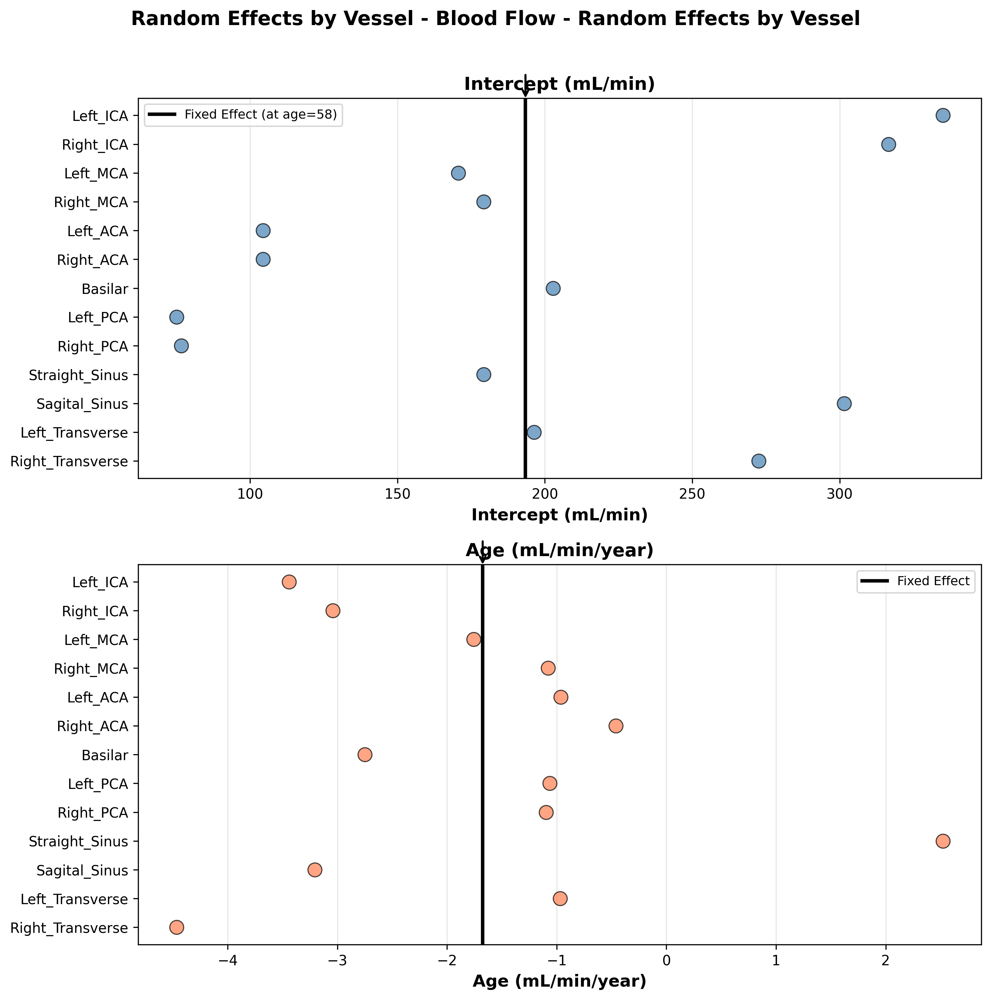

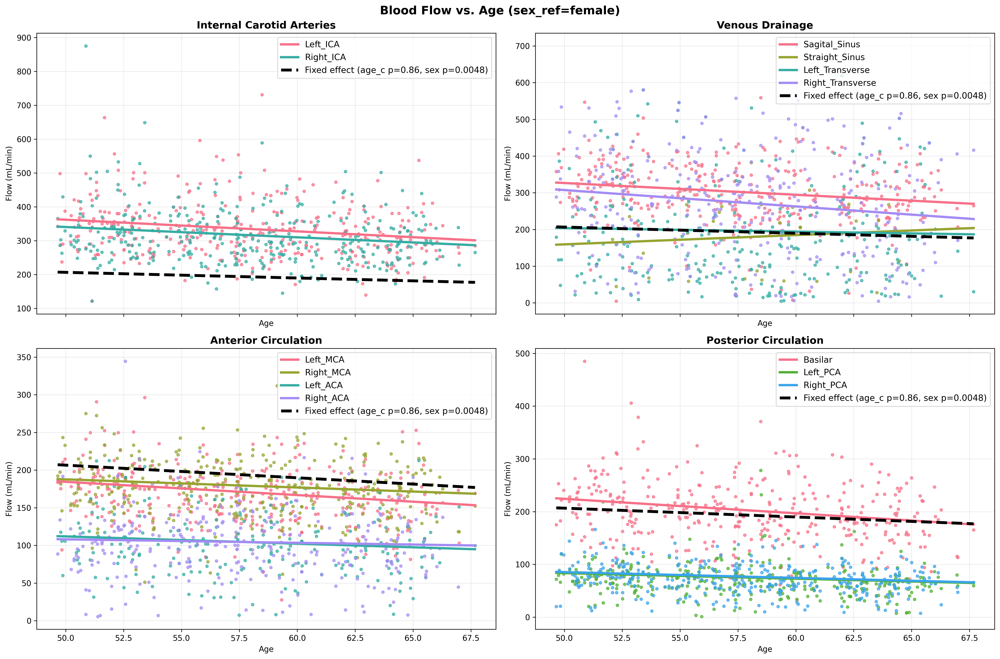

In [15]:
# Create random effects plot (first plot section)
plot_paper_random_effects_by_vessel(
    df_fit=flow_fit,
    res=flow_res,
    output_path=MODELS_DIR / "aging_mm" / "random_effects_by_vessel_flow.png",
    title="Random Effects by Vessel - Blood Flow",
    y_label="mL/min",
    group_name="vessel",
    sex_ref="female"
)

# Create conditional fits plot (second plot section - you already have this)
plot_paper_conditional_fits_by_group(
    df_fit=flow_fit,
    res=flow_res,
    output_path=MODELS_DIR / "aging_mm" / "conditional_fits_by_group_flow.png",
    title="Blood Flow vs. Age",
    y_label="Flow (mL/min)",
    sex_ref="female",
)

# Display an example
from IPython.display import Image, display
out_path = MODELS_DIR / "aging_mm" / "random_effects_by_vessel_flow.png"
if out_path.exists():
    display(Image(str(out_path)))
    
out_path = MODELS_DIR / "aging_mm" / "conditional_fits_by_group_flow.png"
if out_path.exists():
    display(Image(str(out_path)))

PI

In [ ]:
# model_path_pi = MODELS_DIR / "aging_mm" / 'pi_aging_mm.pkl'

# if model_path_pi.exists():
#     print("Loading PI model...")
#     pi_res, pi_fit = _load_paper_mixedlm(model_path_pi, outcome="pi_log", long_df=pi_long)
# else:
#     print("Fitting PI model...")
#     pi_res, pi_fit = _fit_paper_mixedlm(pi_long, outcome="pi_log", model_path=model_path_pi)

In [100]:
model_path_pi = MODELS_DIR / "aging_mm" / 'pi_aging_mm.pkl'
pi_res, pi_fit = fit_or_load_mixedlm(
    model_path_pi, 
    fit_fn=_fit_paper_mixedlm, 
    load_fn=_load_paper_mixedlm,
    long_df=pi_long, outcome="pi"
)

Loading model from /data_local/LabVF/PESA-Brain/RESULTS/Preliminary B1/clinical/mm_models/aging_mm/pi_aging_mm.pkl using _load_paper_mixedlm


In [102]:
print_mixedlm_summary(
    pi_res,
    outcome_name="log(PI)",
    formula="log(PI) ~ 1 + age + sex + (1 + age | vessel) + (1 | participant)",
    group_name="vessel",
    output_path=MODELS_DIR / "aging_mm" / "pi_aging_mm_summary.txt",
    vc_group_name="participant"
)

  Mixed Linear Model - log(PI)

MODEL FORMULA:
  log(PI) ~ 1 + age + sex + (1 + age | vessel) + (1 | participant)

MODEL INFORMATION:
  Number of observations: 4,343
  Number of subjects: 356
  Number of vessel groups: 13
  Group variable: vessel
  Optimization method: REML

--------------------------------------------------------------------------------
FIXED EFFECTS (Population-Level Parameters):
--------------------------------------------------------------------------------
Parameter                         Coef      Std.Err      P-value    Sig
--------------------------------------------------------------------------------
Intercept                      -0.3995       0.0582    6.902e-12    ***
age_c                           0.0144       0.0341        0.674     NS
sex                            -0.0176       0.0082      0.03221      *

Significance: *** <0.001  ** <0.01  * <0.05  . <0.1

--------------------------------------------------------------------------------
VESSEL-LEVEL 

✓ Saved random effects plot: /data_local/LabVF/PESA-Brain/RESULTS/Preliminary B1/clinical/mm_models/aging_mm/random_effects_by_vessel_pi.png


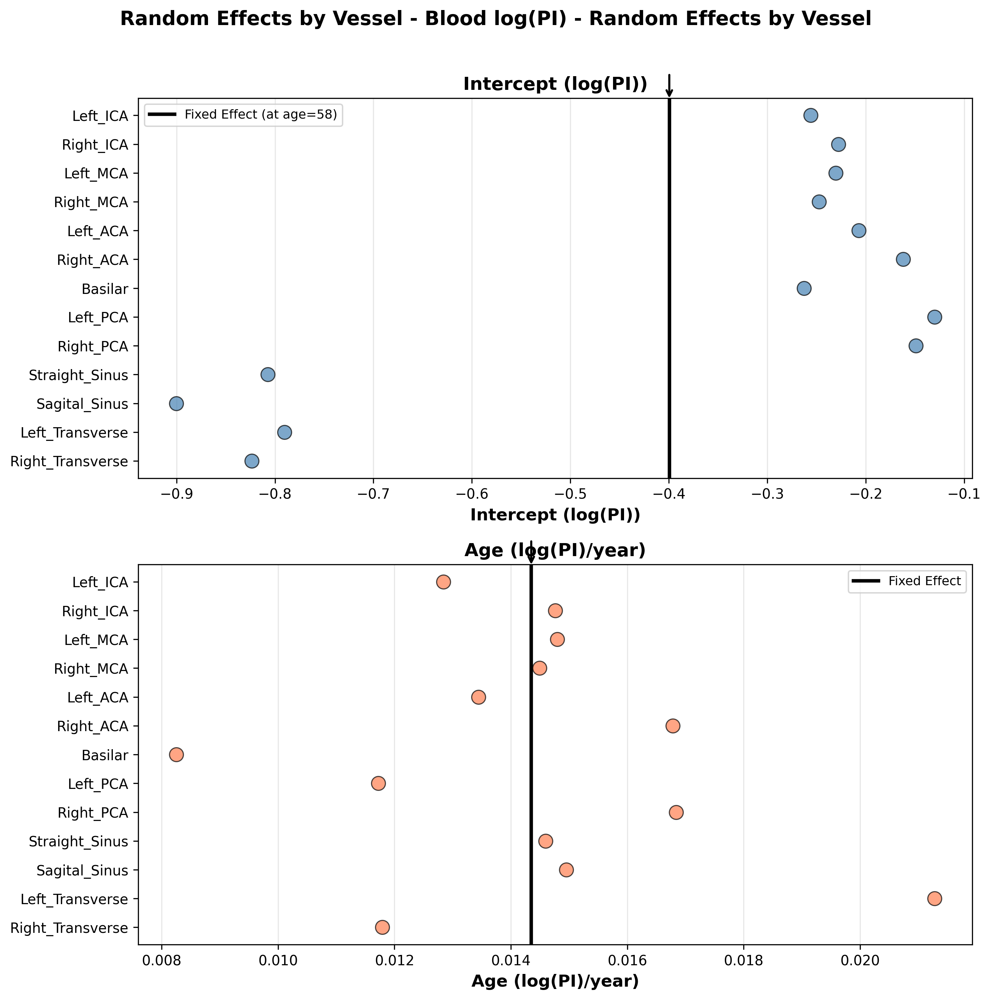

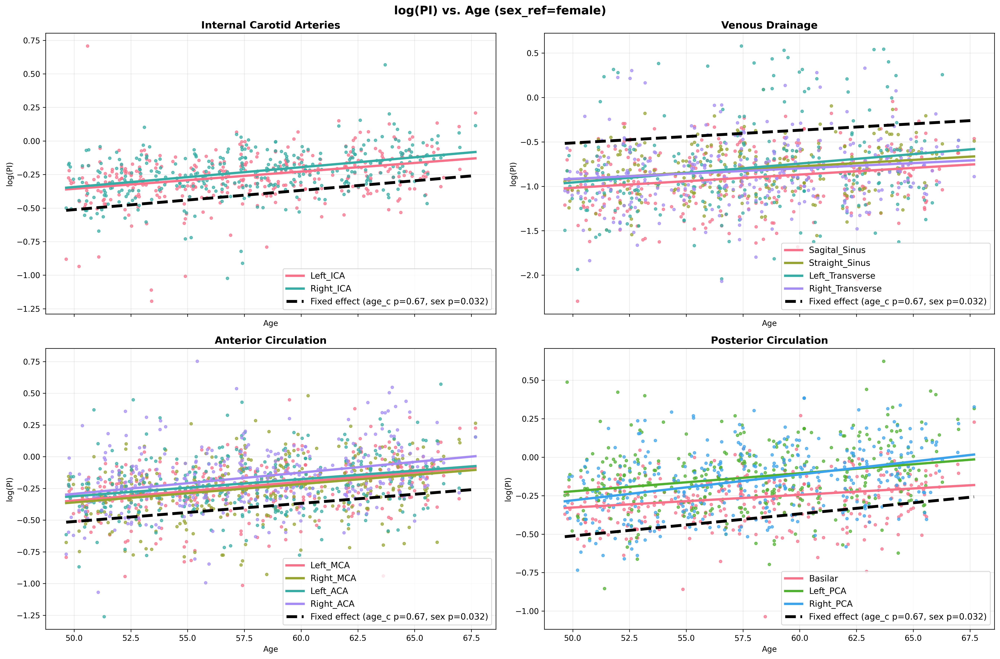

In [103]:
plot_paper_random_effects_by_vessel(
    df_fit=pi_fit,
    res=pi_res,
    output_path=MODELS_DIR / "aging_mm" / "random_effects_by_vessel_pi.png",
    title="Random Effects by Vessel - Blood log(PI)",
    y_label="log(PI)",
    group_name="vessel",
    sex_ref="female"
)

# Create conditional fits plot (second plot section - you already have this)
plot_paper_conditional_fits_by_group(
    df_fit=pi_fit,
    res=pi_res,
    output_path=MODELS_DIR / "aging_mm" / "conditional_fits_by_group_pi.png",
    title="log(PI) vs. Age",
    y_label="log(PI)",
    sex_ref="female",
)

# Display an example
from IPython.display import Image, display
out_path = MODELS_DIR / "aging_mm" / "random_effects_by_vessel_pi.png"
if out_path.exists():
    display(Image(str(out_path)))
    
out_path = MODELS_DIR / "aging_mm" / "conditional_fits_by_group_pi.png"
if out_path.exists():
    display(Image(str(out_path)))

## 2.2. Flow ~ 1 + age_c + sex + hematocrite + (1 + age_c|vessel) + (1|participant)

Generalizable Formulas 

In [13]:
def _fit_mixedlm(
    df: pd.DataFrame, outcome: str,
    formula: str, re_formula: str, vc_formula: dict[str, str], re_groups_name: str="vessel", 
    reml: bool = True, method: str = "lbfgs", maxiter: int = 3000,
    model_path: Path = None,
    dropna_cols: list[str] = None
):
    """Fit a mixed-effects model using statsmodels.

    Args:
        - df (pd.DataFrame): The input data frame.
        - outcome (str): The outcome variable name.
        - formula (str): The fixed effects formula.
        - re_formula (str): The random effects formula.
        - re_groups_name (str): The name of the random effects group.
        - vc_formula (str): The variance components formula.
        - model_path (Path): The path to save the model.
        - dropna_cols (list[str]): The columns to drop NaNs from the data frame.

    Returns:
        - res: statsmodels.regression.mixed_linear_model.MixedLMResults
        - df: pd.DataFrame: The input data frame.
    """
    import warnings 

    from statsmodels.regression.mixed_linear_model import MixedLM
    from statsmodels.tools.sm_exceptions import ConvergenceWarning

    df = df.copy().reset_index(drop=True)
    if not dropna_cols: dropna_cols = ["patient_id", "vessel", "age", "age_c", "sex", "value"]
    df = df.dropna(subset=dropna_cols).reset_index(drop=True)

    # Outcome
    if outcome.lower() == "flow":
        df[outcome] = pd.to_numeric(df["value"], errors="coerce")
        y_label = "Flow (mL/min)"
    elif outcome.lower() in {"pi"}:
        df["value"] = pd.to_numeric(df["value"], errors="coerce")
        df = df.dropna(subset=["value"]).copy()
        # df = df[df["value"] > 0].copy()
        df[outcome] = df["value"]
        y_label = "PI"
    elif outcome.lower() in {"pi_log", "log_pi"}:
        df["value"] = pd.to_numeric(df["value"], errors="coerce")
        df = df.dropna(subset=["value"]).copy()
        # df = df[df["value"] > 0].copy()
        df[outcome] = np.log(df["value"].astype(float))
        y_label = "log(PI)"
    else:
        try:
            df[outcome] = pd.to_numeric(df["value"], errors="coerce")
            y_label = f"{outcome} (numeric)"
        except:
            raise ValueError(f"outcome must be 'flow' or 'pi_log' or 'pi'; {outcome} is not valid")

    # Categories
    if re_groups_name != '1' and re_groups_name in df.columns:
        groups = sorted(df[re_groups_name].unique())
        df[re_groups_name] = pd.Categorical(df[re_groups_name], categories=groups)

    # Fixed effects
    formula = f"{outcome} ~ {formula}"

    model = MixedLM.from_formula(
        formula,
        groups=df[re_groups_name],
        re_formula=re_formula,
        vc_formula=vc_formula,
        data=df
    )
    
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=UserWarning, module="statsmodels")
        warnings.filterwarnings("ignore", category=RuntimeWarning, module="statsmodels")
        warnings.filterwarnings("ignore", category=ConvergenceWarning, module="statsmodels")
        res = model.fit(reml=reml, method=method, maxiter=maxiter)
        
    try:
        y_hat = res.predict(df)
        print(f"Sanity [{y_label}]: obs_mean={float(np.nanmean(df['y'])):.3g} pred_mean={float(np.nanmean(y_hat)):.3g}")
    except Exception:
        pass
    
    if model_path is not None:
        print(f"Saving model results to {model_path}")
        res.save(model_path)

    return res, df


def _load_mixedlm(model_path: Path, *, outcome: str, df: pd.DataFrame=None, re_groups_name: str="vessel"):
    """
    Load a mixed-effects model from a file.

    Args:
        - model_path (Path): The path to the model file.
        - outcome (str): The outcome variable name.
        - df (pd.DataFrame): The long data frame.

    Returns:
        - res: statsmodels.regression.mixed_linear_model.MixedLMResults
        - df: pd.DataFrame: The input data frame.
    """
    from statsmodels.regression.mixed_linear_model import MixedLM
    
    if df is not None:
        df = df.copy().reset_index(drop=True)
        df = df.dropna(subset=["patient_id", "vessel", "age", "age_c", "sex", "value"]).reset_index(drop=True)

        # Outcome
        if outcome.lower() == "flow":
            df["y"] = pd.to_numeric(df["value"], errors="coerce")
            y_label = "Flow (mL/min)"
        elif outcome.lower() in {"pi"}:
            df["value"] = pd.to_numeric(df["value"], errors="coerce")
            df = df.dropna(subset=["value"]).copy()
            df["y"] = df["value"]
            y_label = "PI"
        elif outcome.lower() in {"pi_log", "log_pi"}:
            df["value"] = pd.to_numeric(df["value"], errors="coerce")
            df = df.dropna(subset=["value"]).copy()
            df["y"] = np.log(df["value"].astype(float))
            y_label = "log(PI)"
        else:
            try:
                df["y"] = pd.to_numeric(df["value"], errors="coerce")
                y_label = f"{outcome} (numeric)"
            except:
                raise ValueError(f"outcome must be 'flow' or 'pi_log' or 'pi'; {outcome} is not valid")
        
        # Categories
        if re_groups_name != '1' and re_groups_name in df.columns:
            groups = sorted(df[re_groups_name].unique())
            df[re_groups_name] = pd.Categorical(df[re_groups_name], categories=groups)

        res = MixedLMResults.load(model_path)
        return res, df

    res = MixedLMResults.load(model_path)
    return res, None


def fit_or_load_mixedlm(
    model_path: Path, fit_fn=_fit_mixedlm, load_fn=_load_mixedlm,
    df: pd.DataFrame=None, outcome: str=None,
    re_groups_name: str="vessel",
    overwrite: bool = False,
    **kwargs
):
    """Fit or load a mixed-effects model.

    Args:
        - model_path (Path): The path to the model file.
        - fit_fn (Callable): The function to fit the model.
        - load_fn (Callable): The function to load the model.
        - df (pd.DataFrame): The long data frame.
        - outcome (str): The outcome variable name.
        - re_groups_name (str): The name of the random effects group.
        - dropna_cols (list[str]): The columns to drop NaNs from the data frame.
        - overwrite (bool): Whether to overwrite the model file if it exists.

    Returns:
        - res: statsmodels.regression.mixed_linear_model.MixedLMResults 
        - df: pd.DataFrame: The input data frame.
    """
    if model_path.exists() and not overwrite:
        print(f"Loading model from {model_path}")
        if 'formula' in kwargs: del kwargs['formula']
        if 're_formula' in kwargs: del kwargs['re_formula']
        if 'vc_formula' in kwargs: del kwargs['vc_formula']
        return load_fn(model_path, outcome=outcome, df=df, re_groups_name=re_groups_name, **kwargs)
    
    print(f"Fitting model and saving to {model_path}")
    res, df_res = fit_fn(df, outcome=outcome, re_groups_name=re_groups_name, **kwargs)
    res.save(model_path)
    
    return res, df_res
    

In [14]:
def print_mixedlm_summary(
    res,
    *,
    outcome_name: str = "Outcome",
    group_name: str = "Primary Group",
    vc_group_name: str = "Variance Components",
    output_path: Path = None,
):
    """
    Domain-agnostic summary printer for a statsmodels MixedLM fit.
    Displays fixed effects, dynamically extracted re_formula covariance matrices, 
    vc_formula variance components, residual variance, and BLUPs.
    
    Parameters
    ----------
    res : MixedLMResults
        Fitted mixed linear model results from statsmodels
    outcome_name : str
        Display name of the outcome variable.
    group_name : str
        Display name of the primary grouping variable (level 1).
    vc_group_name : str
        Display name for the variance components (level 2).
    output_path : Path, optional
        File path to save the generated text summary.
    """
    import io
    from contextlib import redirect_stdout

    required_attrs = ["fe_params", "summary", "nobs"]
    missing = [a for a in required_attrs if not hasattr(res, a)]
    if missing:
        raise ValueError(f"Object must be MixedLMResults. Missing attributes: {missing}")

    buffer = io.StringIO()

    with redirect_stdout(buffer):
        print("=" * 80)
        print(f"  Mixed Linear Model - {outcome_name}")
        print("=" * 80)
        print()

        try:
            print("MODEL FORMULA:")
            print(f"  {res.model.formula}")
            print()
        except AttributeError:
            pass

        print("MODEL INFORMATION:")
        print(f"  Observations: {res.nobs:,}")

        ngroups = getattr(res, "ngroups", None)
        if ngroups is None and hasattr(res, "random_effects"):
            ngroups = len(res.random_effects)
        if ngroups is not None:
            print(f"  Number of {group_name} groups: {ngroups:,}")
            
        print(f"  Optimization method: {getattr(res, 'method', 'N/A')}")
        print()

        # FIXED EFFECTS
        print("-" * 80)
        print("FIXED EFFECTS (Population-Level Parameters):")
        print("-" * 80)

        fe = res.fe_params
        fe_se = getattr(res, "bse_fe", getattr(res, "bse", pd.Series()))
        fe_p = getattr(res, "pvalues_fe", getattr(res, "pvalues", pd.Series()))

        print(f"{'Parameter':<25} {'Coef':>12} {'Std.Err':>12} {'P-value':>12} {'Sig':>6}")
        print("-" * 80)

        for param in fe.index:
            coef = fe[param]
            se = fe_se.get(param, np.nan)
            pval = fe_p.get(param, np.nan)

            sig = ""
            if pd.notna(pval):
                if pval < 0.001: sig = "***"
                elif pval < 0.01: sig = "**"
                elif pval < 0.05: sig = "*"
                elif pval < 0.1: sig = "."
                else: sig = "NS"

            print(f"{param:<25} {coef:>12.4f} {se:>12.4f} {pval:>12.4g} {sig:>6}")

        print("\nSignificance: *** <0.001  ** <0.01  * <0.05  . <0.1\n")

        # RE_FORMULA RANDOM EFFECTS (Covariance Matrix)
        if hasattr(res, "cov_re") and not res.cov_re.empty:
            print("-" * 80)
            print(f"{group_name.upper()} RANDOM EFFECTS (from re_formula)")
            print("-" * 80)

            cov_re = res.cov_re
            for i in range(cov_re.shape[0]):
                term = cov_re.index[i]
                var = cov_re.iloc[i, i]
                print(f"  {term}:")
                print(f"    Variance (\u03c3\u00b2): {var:.6f}")
                print(f"    Std. Dev. (\u03c3): {np.sqrt(var):.6f}\n")

            if cov_re.shape[0] > 1:
                print("  Covariances:")
                for i in range(cov_re.shape[0]):
                    for j in range(i + 1, cov_re.shape[1]):
                        print(f"    Cov({cov_re.index[i]}, {cov_re.index[j]}): {cov_re.iloc[i, j]:.6f}")
                print()

        # VC_FORMULA VARIANCE COMPONENTS
        if hasattr(res, "vcomp") and res.vcomp is not None:
            print("-" * 80)
            print(f"VARIANCE COMPONENTS (from vc_formula) - {vc_group_name}")
            print("-" * 80)

            vc_values = res.vcomp
            vc_names = getattr(res.model, "vc_names", [f"VC_{i}" for i in range(len(vc_values))])

            for name, var in zip(vc_names, vc_values):
                print(f"  {name}:")
                print(f"    Variance (\u03c3\u00b2): {var:.6f}")
                print(f"    Std. Dev. (\u03c3): {np.sqrt(var):.6f}\n")

        # RESIDUAL VARIANCE
        if hasattr(res, "scale"):
            print("-" * 80)
            print("RESIDUAL (OBSERVATION-LEVEL)")
            print("-" * 80)
            print(f"  Residual Variance (\u03c3\u00b2): {res.scale:.6f}")
            print(f"  Residual Std. Dev. (\u03c3): {np.sqrt(res.scale):.6f}\n")

        # BLUPs
        if hasattr(res, "random_effects") and res.random_effects:
            re_dict = res.random_effects
            cov_re = getattr(res, "cov_re", pd.DataFrame())
            re_terms = cov_re.columns.tolist() if not cov_re.empty else ["Group"]

            print("-" * 80)
            print(f"GROUP-SPECIFIC ASSESSED PARAMETERS (Fixed + {group_name} BLUPs)")
            print("-" * 80)

            # Create header dynamically based on terms
            header = f"{'Group':<20}"
            for term in re_terms:
                display_term = "Intercept" if term == "Group" else term
                header += f" {display_term:>15}"
            print(header)
            print("-" * len(header))

            for grp, re_vals in re_dict.items():
                row_str = f"{str(grp):<20}"
                for term in re_terms:
                    
                    is_intercept = term in ["Group", "Intercept"]
                    fixed_val = float(fe.get("Intercept", fe.get("const", 0.0))) if is_intercept else float(fe.get(term, 0.0))
                    
                    re_dev = float(re_vals.get(term, 0.0))
                    absolute_val = fixed_val + re_dev
                    row_str += f" {absolute_val:>15.6f}"
                print(row_str)

            print("\nInterpretation: Values represent the absolute parameters (Fixed Effect + Group Deviation).")
            print()

        # FIT STATISTICS
        print("-" * 80)
        print("MODEL FIT STATISTICS:")
        print("-" * 80)
        if hasattr(res, "llf"): print(f"  Log-Likelihood: {res.llf:.4f}")
        if hasattr(res, "aic"): print(f"  AIC: {res.aic:.4f}")
        if hasattr(res, "bic"): print(f"  BIC: {res.bic:.4f}")
        if hasattr(res, "converged"): print(f"\n  Converged: {'Yes' if res.converged else 'No'}")
        print("=" * 80)

    output_text = buffer.getvalue()
    print(output_text)

    if output_path is not None:
        output_path = Path(output_path)
        output_path.parent.mkdir(parents=True, exist_ok=True)
        with open(output_path, "w", encoding="utf-8") as f:
            f.write(output_text)


def plot_random_effects(
    res,
    *,
    output_path: Path,
    title: str = "Random Effects by Group",
    y_label: str = "Outcome",
    group_name: str = "Group",
    covariate_refs = None
):
    """
    Generalized random-effects visualization (Caterpillar/Dot plot).
    Automatically extracts terms from res.cov_re and plots absolute group parameters.
    Handles multiple slope terms without hardcoding.
    
    Parameters
    ----------
    res : MixedLMResults
        Fitted model object.
    output_path : Path
        Path to save the generated plot.
    title : str
        Figure title.
    y_label : str
        Base label for units.
    group_name : str
        Name of the primary grouping variable for display.
    covariate_refs : dict, optional
        Dictionary mapping covariates to reference values to compute absolute intercepts.
    """
    output_path.parent.mkdir(parents=True, exist_ok=True)
    if covariate_refs is None:
        covariate_refs = {}

    fe = res.fe_params
    re_dict = getattr(res, "random_effects", {})
    if not re_dict:
        warnings.warn("No random effects found in model results.")
        return

    # Automatically identify terms from cov_re
    cov_re = getattr(res, "cov_re", pd.DataFrame())
    re_terms = cov_re.columns.tolist() if not cov_re.empty else ["Group"]
    
    groups = sorted(list(re_dict.keys()))
    n_groups = len(groups)
    n_terms = len(re_terms)
    
    # Calculate baseline fixed intercept (evaluated at reference covariates)
    fixed_int = float(fe.get("Intercept", fe.get("const", 0.0)))
    for k, v in covariate_refs.items():
        fixed_int += float(fe.get(k, 0.0)) * v

    fig, axes = plt.subplots(n_terms, 1, figsize=(10, max(5, n_groups * 0.4 * n_terms)), sharey=True)
    if n_terms == 1:
        axes = [axes]

    y_pos = np.arange(n_groups)
    colors = sns.color_palette("Set2", n_colors=n_terms)

    for i, (ax, term) in enumerate(zip(axes, re_terms)):
        
        # Determine fixed effect baseline for this term
        is_intercept = term in ["Group", "Intercept"]
        if is_intercept:
            fe_baseline = fixed_int
            x_title = f"Intercept ({y_label})"
        else:
            fe_baseline = float(fe.get(term, 0.0))
            x_title = f"Slope: {term} ({y_label}/unit)"

        # Extract absolute parameters for each group
        abs_vals = []
        for group in groups:
            re_vals = re_dict[group]
            re_dev = float(re_vals.get(term, 0.0))
            abs_vals.append(fe_baseline + re_dev)

        # Plot
        ax.scatter(abs_vals, y_pos, s=100, alpha=0.8, color=colors[i], edgecolors="black", linewidth=0.8, zorder=3)
        ax.axvline(x=fe_baseline, color="black", linewidth=2.5, linestyle="-", zorder=2, label="Fixed Effect Pop. Avg.")
        
        ax.set_yticks(y_pos)
        ax.set_yticklabels(groups, fontsize=10)
        ax.set_xlabel(x_title, fontsize=12, fontweight="bold")
        ax.set_title(x_title, fontsize=13, fontweight="bold")
        ax.grid(True, alpha=0.3, axis="x")
        ax.legend(loc="best", fontsize=9)
        
        if i == 0:
            ax.invert_yaxis()

    fig.suptitle(f"{title} - Absolute Parameters by {group_name}", fontsize=15, fontweight="bold", y=0.98 + (0.01/n_terms))
    fig.tight_layout()
    fig.savefig(output_path, dpi=300, bbox_inches="tight")
    plt.close(fig)


def plot_mixedlm_conditional_fits(
    df_fit: pd.DataFrame,
    res,
    *,
    x_var_data: str,
    x_var_model: str,
    group_var: str,
    output_path: Path,
    grouping_dict = None,
    title: str = "Conditional Fits",
    y_label: str = "Outcome",
    x_label: str = "Predictor",
    x_center_val: float = 0.0,
    covariate_refs = None,
    plot_points: bool = True
):
    """
    Generalized plotting utility for MixedLM conditional fits (fixed + group REs).
    Supports grouping lines into unified subplots via `grouping_dict`.
    
    Parameters
    ----------
    df_fit : pd.DataFrame
        Data used for fitting the model (for scatter plots and limits).
    res : MixedLMResults
        Fitted model object.
    x_var_data : str
        The raw predictor variable in `df_fit` used for the X-axis (e.g., "age").
    x_var_model : str
        The predictor variable exactly as named in the model formula (e.g., "age_c").
    group_var : str
        The primary grouping variable in `df_fit` (e.g., "vessel", "site").
    output_path : Path
        Path to save the generated plot.
    grouping_dict : dict, optional
        A dictionary mapping subplot titles to a list of group values that should 
        be plotted in that subplot. If None, plots one subplot per unique group.
    title : str
        Figure title.
    y_label : str
        Label for the Y-axis.
    x_label : str
        Label for the X-axis.
    x_center_val : float
        Value subtracted from x_var_data to create x_var_model (if centered).
    covariate_refs : dict, optional
        Dictionary mapping fixed effect covariates to static reference values.
    plot_points : bool
        Whether to plot raw data points behind the conditional lines.
    """
    output_path.parent.mkdir(parents=True, exist_ok=True)
    
    # 1. Prepare X-axis range
    x_raw = pd.to_numeric(df_fit[x_var_data], errors="coerce").to_numpy()
    x_raw = x_raw[np.isfinite(x_raw)]
    x_line_raw = np.linspace(float(np.nanmin(x_raw)), float(np.nanmax(x_raw)), 200)

    # 2. Determine centering constant (if model uses centered x, but we plot raw x)
    try:
        # Check if the model data has the raw variable to find the mean used during training
        model_df = res.model.data.frame
        x_train_mean = float(np.nanmean(pd.to_numeric(model_df[x_var_data], errors="coerce")))
    except Exception:
        x_train_mean = float(np.nanmean(x_raw))
    
    x_line_model = x_line_raw - x_train_mean if x_var_model != x_var_data else x_line_raw

    # 3. Calculate Fixed Effect Contribution from Covariates
    fe = res.fe_params
    b_int = float(fe.get("Intercept", fe.get("const", 0.0)))
    b_x = float(fe.get(x_var_model, 0.0))
    
    # Sum up (beta_i * ref_val_i) for all other fixed effects
    cov_contribution = 0.0
    if covariate_refs:
        for cov_name, val in covariate_refs.items():
            cov_contribution += float(fe.get(cov_name, 0.0)) * val

    # Population fixed line: Y = (Intercept + Cov_Contrib) + (Slope * X_model)
    y_fixed = (b_int + cov_contribution) + (b_x * x_line_model)

    # 4. Extract P-values for legend
    try:
        p_val_x = res.pvalues.get(x_var_model, np.nan)
    except Exception:
        p_val_x = np.nan

    # 5. Plotting Grid
    n_subplots = len(grouping_dict) if grouping_dict else len(df_fit[group_var].unique())
    n_cols = 2
    n_rows = int(np.ceil(n_subplots / n_cols))
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 12), sharex=True, sharey=False)
    axes = axes.flatten()

    all_groups_in_data = set(df_fit[group_var].unique())
    re_dict = getattr(res, "random_effects", {})

    if grouping_dict:
        for ax, (subplot_title, members) in zip(axes, grouping_dict.items()):
            present_members = [m for m in members if m in all_groups_in_data]
            
            if not present_members:
                ax.axis("off")
                continue

            palette = sns.color_palette("husl", n_colors=len(present_members))

            for i, m in enumerate(present_members):
                # Raw Data Scatter
                sub = df_fit[df_fit[group_var] == m]
                # Use the actual outcome column from the dataframe
                y_col = res.model.endog_names
                try:
                    ax.scatter(sub[x_var_data], sub[y_col], s=12, alpha=0.7, color=palette[i])
                except Exception:
                    y_col = 'y'
                    ax.scatter(sub[x_var_data], sub[y_col], s=12, alpha=0.7, color=palette[i])

                # Random Effects Extraction
                re = re_dict.get(m, re_dict.get(str(m), None))

                re_int_dev = 0.0
                re_x_dev = 0.0

                if re is not None:
                    # 1. Get Intercept Deviation
                    # 'Group' is the standard name for the re_formula intercept in MixedLM
                    re_int_dev = float(re.get("Group", re.get("Intercept", re.iloc[0])))
                    
                    # 2. Get Slope Deviation ONLY if it was actually modeled
                    # Use .get() without a positional fallback to avoid grabbing participant VCs
                    if x_var_model in re:
                        re_x_dev = float(re[x_var_model])
                    else:
                        re_x_dev = 0.0 # Force same slope if not in re_formula

                # Conditional Line = (Fixed_Int + RE_Int + Cov_Contrib) + (Fixed_Slope + RE_Slope) * X_model
                y_cond = (b_int + re_int_dev + cov_contribution) + (b_x + re_x_dev) * x_line_model
                
                ax.plot(x_line_raw, y_cond, color=palette[i], linewidth=3, alpha=1, label=str(m))

            # 6. Draw Fixed Effect (Population) Line
            ax.plot(
                x_line_raw,
                y_fixed,
                color="black",
                linewidth=3.7,
                linestyle="--",
                label=f"Fixed effect ({x_var_model} p={p_val_x:.2g})",
            )

            ax.set_title(subplot_title, fontsize=13, fontweight="bold")
            ax.set_xlabel(x_label)
            ax.set_ylabel(y_label)
            ax.grid(True, alpha=0.25)
            ax.legend(loc="best", fontsize=11)
    else:
        palette = sns.color_palette("husl", n_colors=len(df_fit[group_var].unique()))
        for i, (ax, m) in enumerate(zip(axes, df_fit[group_var].unique())):
            # Raw Data Scatter
            sub = df_fit[df_fit[group_var] == m]
            # Use the actual outcome column from the dataframe
            y_col = res.model.endog_names
            try:
                ax.scatter(sub[x_var_data], sub[y_col], s=12, alpha=0.7, color=palette[i])
            except Exception:
                y_col = 'y'
                ax.scatter(sub[x_var_data], sub[y_col], s=12, alpha=0.7, color=palette[i])

            # Random Effects Extraction
            re = re_dict.get(m, re_dict.get(str(m), None))

            re_int_dev = 0.0
            re_x_dev = 0.0

            if re is not None:
                # 1. Get Intercept Deviation
                # 'Group' is the standard name for the re_formula intercept in MixedLM
                re_int_dev = float(re.get("Group", re.get("Intercept", re.iloc[0])))
                
                # 2. Get Slope Deviation ONLY if it was actually modeled
                # Use .get() without a positional fallback to avoid grabbing participant VCs
                if x_var_model in re:
                    re_x_dev = float(re[x_var_model])
                else:
                    re_x_dev = 0.0 # Force same slope if not in re_formula

            # Conditional Line = (Fixed_Int + RE_Int + Cov_Contrib) + (Fixed_Slope + RE_Slope) * X_model
            y_cond = (b_int + re_int_dev + cov_contribution) + (b_x + re_x_dev) * x_line_model
            
            ax.plot(x_line_raw, y_cond, color=palette[i], linewidth=3, alpha=1, label=str(m))

            # 6. Draw Fixed Effect (Population) Line
            ax.plot(
                x_line_raw,
                y_fixed,
                color="black",
                linewidth=3.7,
                linestyle="--",
                label=f"Fixed effect ({x_var_model} p={p_val_x:.2g})",
            )

            ax.set_title(f'{m}', fontsize=13, fontweight="bold")
            ax.set_xlabel(x_label)
            ax.set_ylabel(y_label)
            ax.grid(True, alpha=0.25)
            ax.legend(loc="best", fontsize=11)

    # Clean up empty slots
    if grouping_dict:
        for j in range(len(grouping_dict), len(axes)):
            axes[j].axis("off")
    else:
        for j in range(len(df_fit[group_var].unique()), len(axes)):
            axes[j].axis("off")

    fig.suptitle(title, fontsize=15, fontweight="bold")
    fig.tight_layout()
    fig.savefig(output_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

In [15]:
flow_h_long = build_long_vessel_df(clinical_df, flow_table, outcome_label="Flow (mL/min)", exclude_vessels=EXCLUDE_FOR_MIXEDLM, column_names=["patient_id", "age_at_mri", "sex", "hematocrit"])
pi_h_long = build_long_vessel_df(clinical_df, pi_table, outcome_label="PI", exclude_vessels=EXCLUDE_FOR_MIXEDLM, column_names=["patient_id", "age_at_mri", "sex", "hematocrit"])

print(flow_h_long.head())
print(pi_h_long.head())


     patient_id    vessel       value    age  sex  hematocrit     age_c  \
0   PESA1006009  Left_ICA  267.035802  62.87  1.0        47.0  5.072107   
1  PESA10061584  Left_ICA   94.844843  64.27  1.0        48.0  6.472107   
2  PESA10067929  Left_ICA  323.586469  64.54  1.0        42.0  6.742107   
3  PESA10086976  Left_ICA  303.364359  53.19  0.0        45.0 -4.607893   
4  PESA10112400  Left_ICA  325.856177  53.74  1.0        48.0 -4.057893   

         outcome  
0  Flow (mL/min)  
1  Flow (mL/min)  
2  Flow (mL/min)  
3  Flow (mL/min)  
4  Flow (mL/min)  
     patient_id    vessel     value    age  sex  hematocrit     age_c outcome
0   PESA1006009  Left_ICA  0.701133  62.87  1.0        47.0  5.072107      PI
1  PESA10061584  Left_ICA  0.639911  64.27  1.0        48.0  6.472107      PI
2  PESA10067929  Left_ICA  0.773645  64.54  1.0        42.0  6.742107      PI
3  PESA10086976  Left_ICA  0.540127  53.19  0.0        45.0 -4.607893      PI
4  PESA10112400  Left_ICA  0.707761  53.74  1

In [129]:
hematocrite_model_path = MODELS_DIR / "aging_mm" / "flow_hematocrit_aging_mm.pkl"

res, df_fit = fit_or_load_mixedlm(
    hematocrite_model_path,
    fit_fn=_fit_mixedlm,
    load_fn=_load_mixedlm,
    df=flow_h_long,
    outcome="flow",
    overwrite=True,
    formula="1 + age_c + sex + hematocrit",
    re_formula="1 + age_c",
    re_groups_name="vessel",
    vc_formula={"participant": "0 + C(patient_id)"},
)

Fitting model and saving to /data_local/LabVF/PESA-Brain/RESULTS/Preliminary B1/clinical/mm_models/aging_mm/flow_hematocrit_aging_mm.pkl


In [152]:
print_mixedlm_summary(
    res,
    outcome_name='Flow',
    # formula='f ~ 1 + age_c + sex + hematocrit + (1 + age_c|vessel) + (1|participant)',
    group_name='vessel',
    vc_group_name='participant',
    output_path=MODELS_DIR / "aging_mm" / "flow_hematocrit_aging_mm_summary.txt"
)

  Mixed Linear Model - Flow

MODEL FORMULA:
  flow ~ 1 + age_c + sex + hematocrit

MODEL INFORMATION:
  Observations: 4,318
  Number of vessel groups: 13
  Optimization method: REML

--------------------------------------------------------------------------------
FIXED EFFECTS (Population-Level Parameters):
--------------------------------------------------------------------------------
Parameter                         Coef      Std.Err      P-value    Sig
--------------------------------------------------------------------------------
Intercept                     290.4247      20.1961    6.887e-47    ***
age_c                          -1.3583       9.5557        0.887     NS
sex                            -0.0119       2.6367       0.9964     NS
hematocrit                     -2.5752       0.3249    2.268e-15    ***

Significance: *** <0.001  ** <0.01  * <0.05  . <0.1

--------------------------------------------------------------------------------
VESSEL RANDOM EFFECTS (from re_for

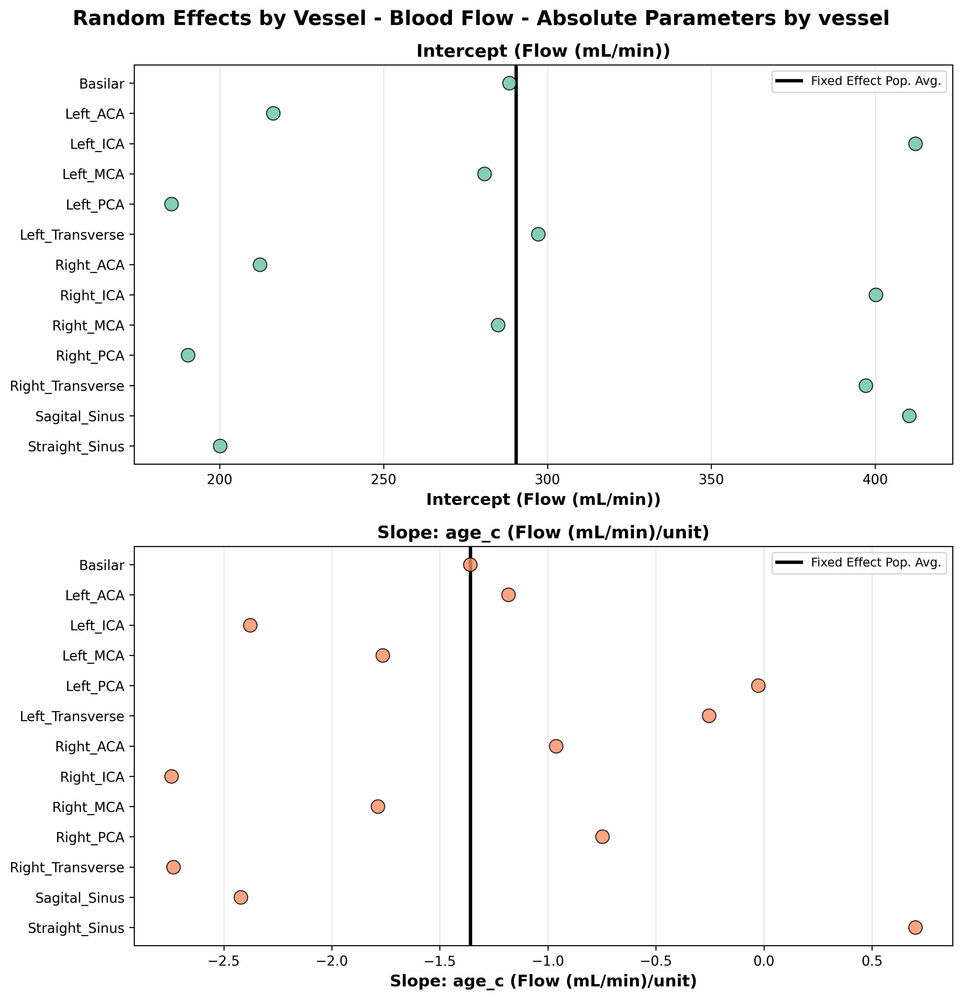

In [154]:
plot_random_effects(
    res=res,
    output_path=MODELS_DIR / "aging_mm" / "flow_hematocrit_aging_mm_random_effects.png",
    title="Random Effects by Vessel - Blood Flow",
    y_label="Flow (mL/min)",
    group_name="vessel",
)

display(Image(str(MODELS_DIR / "aging_mm" / "flow_hematocrit_aging_mm_random_effects.png")))


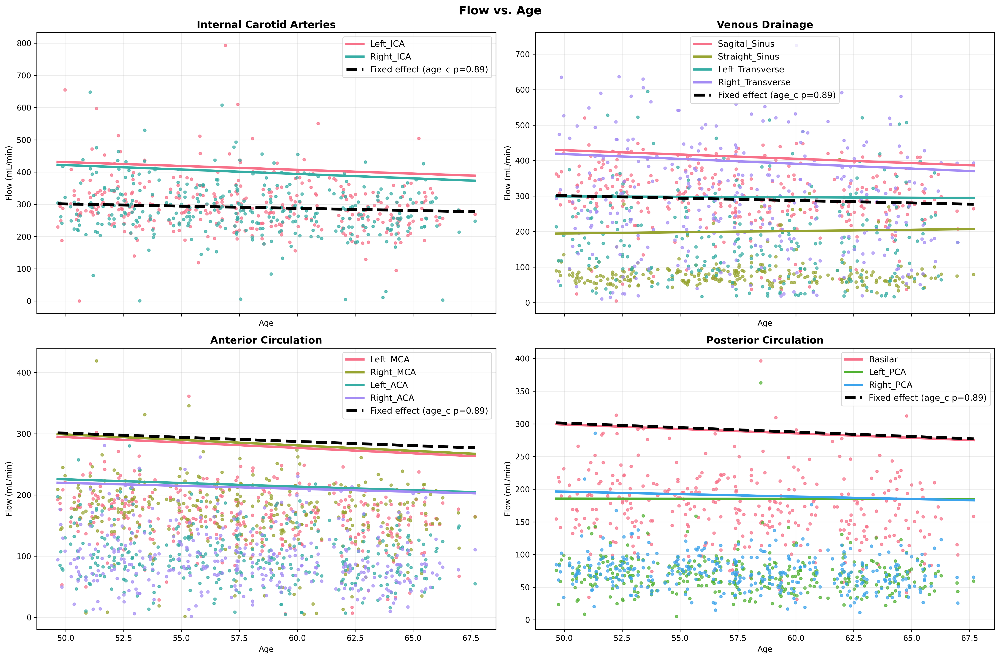

In [161]:
plot_mixedlm_conditional_fits(
    df_fit=df_fit,
    res=res,
    x_var_data='age',
    x_var_model='age_c',
    group_var='vessel',
    output_path=MODELS_DIR / "aging_mm" / "flow_hematocrit_aging_mm_conditional_fits.png",
    grouping_dict=VESSEL_GROUPS_ORDER,
    title="Flow vs. Age",
    y_label="Flow (mL/min)",
    x_label="Age",
    x_center_val=0.0,
    covariate_refs={"hematocrit": 0.0},
    plot_points=True
)

display(Image(str(MODELS_DIR / "aging_mm" / "flow_hematocrit_aging_mm_conditional_fits.png")))

## 2.3. Flow ~ 1 + bs(age_c) + sex + (1 + bs(age_c)|vessel) + (1|participant)

B-Spline

In [186]:
spline_model_path = MODELS_DIR / "aging_mm" / "flow_bspline_aging_mm.pkl"

res, df_fit = fit_or_load_mixedlm(
    spline_model_path,
    fit_fn=_fit_mixedlm,
    load_fn=_load_mixedlm,
    df=flow_h_long,
    outcome="flow",
    overwrite=True,
    formula="1 + bs(age_c, df=3, degree=3) + sex",
    re_formula="1 + age_c",
    re_groups_name="vessel",
    vc_formula={"participant": "0 + C(patient_id)"},
)


Fitting model and saving to /data_local/LabVF/PESA-Brain/RESULTS/Preliminary B1/clinical/mm_models/aging_mm/flow_bspline_aging_mm.pkl


In [190]:
print_mixedlm_summary(
    res,
    outcome_name='Flow',
    group_name='vessel',
    vc_group_name='participant',
    output_path=MODELS_DIR / "aging_mm" / "flow_bspline_aging_mm_summary.txt"
)

  Mixed Linear Model - Flow

MODEL FORMULA:
  flow ~ 1 + bs(age_c, df=3, degree=3) + sex

MODEL INFORMATION:
  Observations: 4,318
  Number of vessel groups: 13
  Optimization method: REML

--------------------------------------------------------------------------------
FIXED EFFECTS (Population-Level Parameters):
--------------------------------------------------------------------------------
Parameter                         Coef      Std.Err      P-value    Sig
--------------------------------------------------------------------------------
Intercept                     191.8394      80.1488      0.01669      *
bs(age_c, df=3, degree=3)[0]       0.2412      59.4456       0.9968     NS
bs(age_c, df=3, degree=3)[1]     -28.1166     115.9108       0.8083     NS
bs(age_c, df=3, degree=3)[2]     -20.1350     173.4966       0.9076     NS
sex                            -9.7900       2.3629    3.425e-05    ***

Significance: *** <0.001  ** <0.01  * <0.05  . <0.1

---------------------------

In [16]:
def plot_conditional_fits_nonlinear(
    df_fit: pd.DataFrame,
    res,
    *,
    output_path: Path,
    title: str,
    y_label: str,
    x_var_data: str,     # The raw name, e.g., "age"
    group_var: str,      # e.g., "vessel"
    grouping_dict,
    covariate_vals = None,
    x_label: str = "Age",
):
    """
    Spline-capable version of the paper-style conditional fits.
    Uses model.predict() to handle non-linear basis expansions (B-splines, polynomials).
    """
    output_path.parent.mkdir(parents=True, exist_ok=True)
    covariate_vals = covariate_vals or {}

    # 1. Create a prediction range for the raw X variable
    x_raw = pd.to_numeric(df_fit[x_var_data], errors="coerce").to_numpy()
    x_raw = x_raw[np.isfinite(x_raw)]
    x_line = np.linspace(float(np.nanmin(x_raw)), float(np.nanmax(x_raw)), 200)

    # 2. Build a prediction dataframe
    # This MUST contain all variables used in the model formula
    df_pred = pd.DataFrame({x_var_data: x_line})
    for cov, val in covariate_vals.items():
        df_pred[cov] = val
    
    # Fill in any missing columns required by the model with their means
    for col in res.model.exog_names:
        if col not in df_pred.columns and col not in ["Intercept", "const"]:
            # This handles cases where spline terms like 'bs(age, df=3)[0]' exist
            # We don't add those manually; the model formula handles it if we provide 'age'
            pass

    # 3. Get Population-Level (Fixed) Predictions
    # res.predict() handles the spline expansion automatically
    y_fixed = res.predict(df_pred)

    # 4. Extract Random Effects
    re_dict = getattr(res, "random_effects", {})
    all_groups_in_data = set(df_fit[group_var].unique())

    # 5. Plotting
    n_subplots = len(grouping_dict)
    fig, axes = plt.subplots(int(np.ceil(n_subplots/2)), 2, figsize=(18, 12), sharex=True)
    axes = axes.flatten()

    for ax, (subplot_title, members) in zip(axes, grouping_dict.items()):
        present_members = [m for m in members if m in all_groups_in_data]
        if not present_members:
            ax.axis("off")
            continue

        palette = sns.color_palette("husl", n_colors=len(present_members))

        for i, m in enumerate(present_members):
            # Plot raw data
            sub = df_fit[df_fit[group_var] == m]
            y_col = res.model.endog_names
            ax.scatter(sub[x_var_data], sub[y_col], s=12, alpha=0.6, color=palette[i])

            # Calculate Conditional Fit
            # Formula: Fixed Prediction + Random Intercept + (Random Slope * X)
            re = re_dict.get(m, re_dict.get(str(m), None))
            re_int = 0.0
            re_slope = 0.0
            
            if re is not None:
                # Intercept deviation
                re_int = float(re.get("Group", re.get("Intercept", re.iloc[0])))
                # Note: Usually, even with splines, random slopes are kept linear 
                # for convergence. If you have a random slope on a specific term:
                if x_var_data in re:
                    re_slope = float(re[x_var_data])
            
            # Add the BLUPs to the fixed line
            y_cond = y_fixed + re_int + (re_slope * (x_line - np.mean(x_raw)))
            ax.plot(x_line, y_cond, color=palette[i], linewidth=3, label=str(m))

        # Population line
        ax.plot(x_line, y_fixed, color="black", linewidth=3.7, linestyle="--", label="Fixed Effect (Avg)")

        ax.set_title(subplot_title, fontsize=13, fontweight="bold")
        ax.set_xlabel(x_label)
        ax.set_ylabel(y_label)
        ax.legend(loc="best", fontsize=10)

    fig.tight_layout()
    fig.savefig(output_path, dpi=300)
    plt.close(fig)

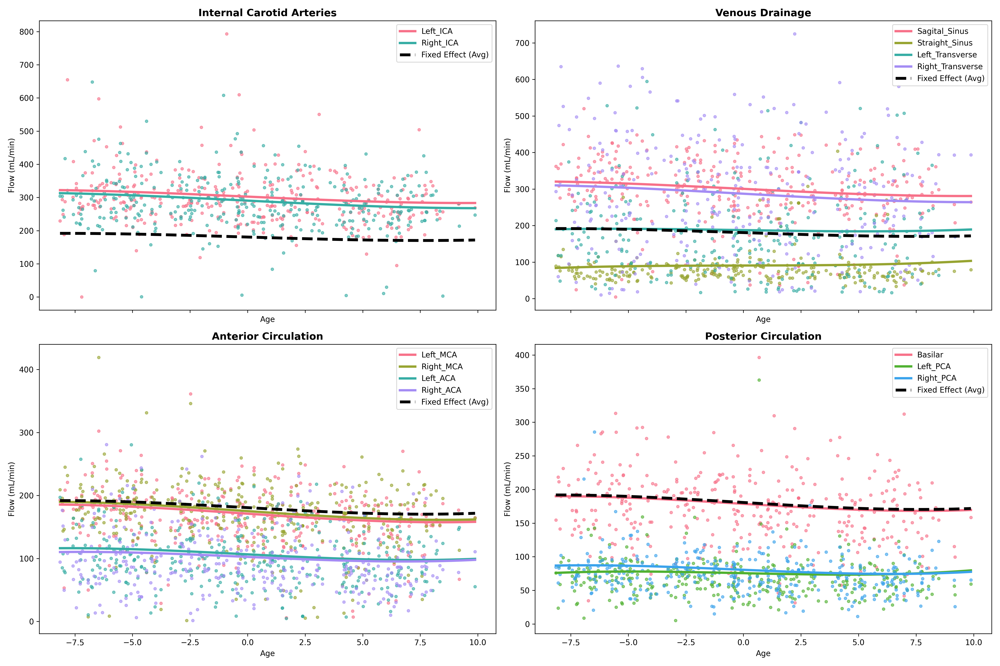

In [188]:
plot_conditional_fits_nonlinear(
    df_fit=df_fit,
    res=res,
    output_path=MODELS_DIR / "aging_mm" / "flow_bspline_aging_mm_conditional_fits.png",
    title="Flow vs. Age",
    y_label="Flow (mL/min)",
    x_var_data='age_c',
    group_var='vessel',
    grouping_dict=VESSEL_GROUPS_ORDER,
    covariate_vals={"sex": 0.0},
    x_label="Age",
)

display(Image(str(MODELS_DIR / "aging_mm" / "flow_bspline_aging_mm_conditional_fits.png")))

## 2.4. Flow ~ 1 + ASLwb + age_c + sex + (1|vessel) + (1|participant)

In [17]:
EXCLUDE_FOR_MIXEDLM_ASL = {"TCBF", 'Left_Communicating', 'Right_Communicating'}

flow_long_asl = build_long_vessel_df(
    clinical_df, flow_table, 
    outcome_label="Flow (mL/min)", exclude_vessels=EXCLUDE_FOR_MIXEDLM_ASL, 
    column_names=["patient_id", "age_at_mri", "sex", "hematocrit", "ctx_whole_brain", "ctx_left_hemisphere", "ctx_right_hemisphere"]
)
pi_long_asl = build_long_vessel_df(
    clinical_df, pi_table, 
    outcome_label="PI", exclude_vessels=EXCLUDE_FOR_MIXEDLM_ASL, 
    column_names=["patient_id", "age_at_mri", "sex", "hematocrit", "ctx_whole_brain", "ctx_left_hemisphere", "ctx_right_hemisphere"]
)

print(flow_long_asl.head())


     patient_id    vessel       value    age  sex  hematocrit  \
0   PESA1006009  Left_ICA  267.035802  62.87  1.0        47.0   
1  PESA10061584  Left_ICA   94.844843  64.27  1.0        48.0   
2  PESA10067929  Left_ICA  323.586469  64.54  1.0        42.0   
3  PESA10086976  Left_ICA  303.364359  53.19  0.0        45.0   
4  PESA10112400  Left_ICA  325.856177  53.74  1.0        48.0   

   ctx_whole_brain  ctx_left_hemisphere  ctx_right_hemisphere     age_c  \
0        64.850706            63.393821             66.288385  5.072107   
1        43.683496            44.220321             43.141605  6.472107   
2        71.819444            69.764533             73.896158  6.742107   
3        65.740547            63.598031             67.886590 -4.607893   
4        57.550002            56.656838             58.416831 -4.057893   

         outcome  
0  Flow (mL/min)  
1  Flow (mL/min)  
2  Flow (mL/min)  
3  Flow (mL/min)  
4  Flow (mL/min)  


In [18]:
asl_wb_model_path = MODELS_DIR / "perfusion_mm" / "asl_wb_aging_mm.pkl"

res, df_fit = fit_or_load_mixedlm(
    asl_wb_model_path,
    fit_fn=_fit_mixedlm,
    load_fn=_load_mixedlm,
    df=flow_long_asl,
    outcome="flow",
    overwrite=True,
    formula="1 + ctx_whole_brain + age_c + sex",
    re_formula="1",
    re_groups_name="vessel",
    vc_formula={"participant": "0 + C(patient_id)"},
)


Fitting model and saving to /data_local/LabVF/PESA-Brain/RESULTS/Preliminary B1/clinical/mm_models/perfusion_mm/asl_wb_aging_mm.pkl


In [19]:
print_mixedlm_summary(
    res,
    outcome_name='Flow',
    group_name='vessel',
    vc_group_name='participant',
    output_path=MODELS_DIR / "perfusion_mm" / "asl_wb_aging_mm_summary.txt"
)

  Mixed Linear Model - Flow

MODEL FORMULA:
  flow ~ 1 + ctx_whole_brain + age_c + sex

MODEL INFORMATION:
  Observations: 4,318
  Number of vessel groups: 13
  Optimization method: REML

--------------------------------------------------------------------------------
FIXED EFFECTS (Population-Level Parameters):
--------------------------------------------------------------------------------
Parameter                         Coef      Std.Err      P-value    Sig
--------------------------------------------------------------------------------
Intercept                      52.4424      18.6325     0.004884     **
ctx_whole_brain                 2.0195       0.1226    6.065e-61    ***
age_c                          -0.8369       0.2379    0.0004353    ***
sex                             1.8480       2.3760       0.4367     NS

Significance: *** <0.001  ** <0.01  * <0.05  . <0.1

--------------------------------------------------------------------------------
VESSEL RANDOM EFFECTS (from r

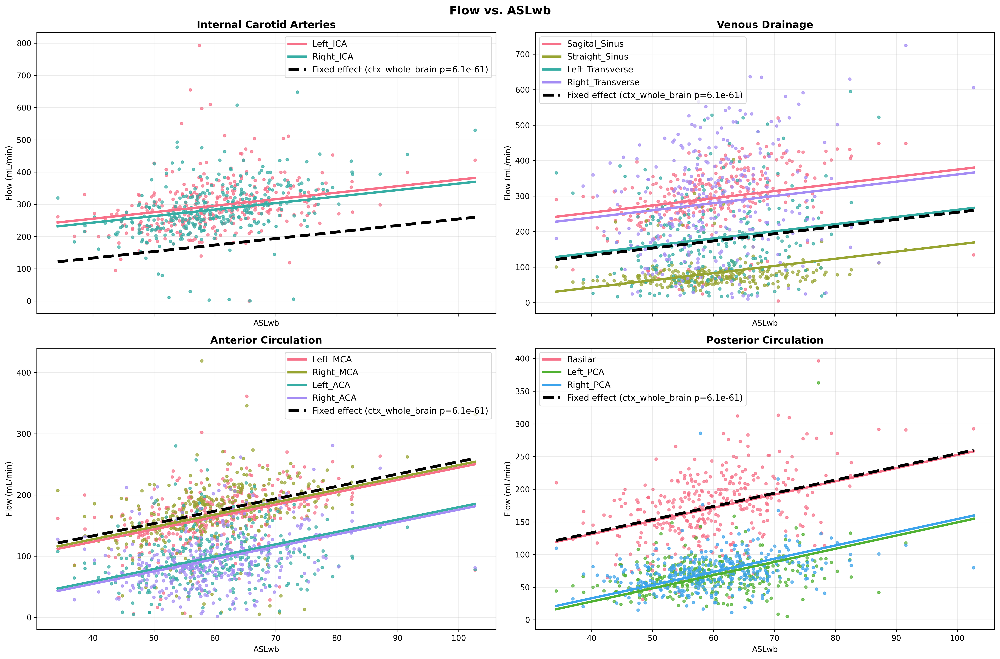

In [196]:
plot_mixedlm_conditional_fits(
    df_fit=df_fit,
    res=res,
    x_var_data='ctx_whole_brain',
    x_var_model='ctx_whole_brain',
    group_var='vessel',
    output_path=MODELS_DIR / "perfusion_mm" / "asl_wb_aging_mm_conditional_fits.png",
    grouping_dict=VESSEL_GROUPS_ORDER,
    title="Flow vs. ASLwb",
    y_label="Flow (mL/min)",
    x_label="ASLwb",
    # x_center_val=0.0,
    covariate_refs={"age_c": 0.0},
    plot_points=True
)

display(Image(str(MODELS_DIR / "perfusion_mm" / "asl_wb_aging_mm_conditional_fits.png")))

## 2.5. Flow ~ 1 + ASLwb + age_c + sex + hematoc + (1|vessel) + (1|participant)

In [20]:
asl_wb_model_path = MODELS_DIR / "perfusion_mm" / "asl_wb_aging_mm.pkl"

res, df_fit = fit_or_load_mixedlm(
    asl_wb_model_path,
    fit_fn=_fit_mixedlm,
    load_fn=_load_mixedlm,
    df=flow_long_asl,
    outcome="flow",
    overwrite=True,
    formula="1 + ctx_whole_brain + age_c + sex + hematocrit",
    re_formula="1",
    re_groups_name="vessel",
    vc_formula={"participant": "0 + C(patient_id)"},
)

print_mixedlm_summary(
    res,
    outcome_name='Flow',
    group_name='vessel',
    vc_group_name='participant',
    output_path=MODELS_DIR / "perfusion_mm" / "asl_wb_aging_mm_summary.txt"
)

plot_mixedlm_conditional_fits(
    df_fit=df_fit,
    res=res,
    x_var_data='ctx_whole_brain',
    x_var_model='ctx_whole_brain',
    group_var='vessel',
    output_path=MODELS_DIR / "perfusion_mm" / "asl_wb_aging_mm_conditional_fits.png",
    grouping_dict=VESSEL_GROUPS_ORDER,
    title="Flow vs. ASLwb",
    y_label="Flow (mL/min)",
    x_label="ASLwb",
    # x_center_val=0.0,
    covariate_refs={"age_c": 0.0},
    plot_points=True
)

display(Image(str(MODELS_DIR / "perfusion_mm" / "asl_wb_aging_mm_conditional_fits.png")))

Fitting model and saving to /data_local/LabVF/PESA-Brain/RESULTS/Preliminary B1/clinical/mm_models/perfusion_mm/asl_wb_aging_mm.pkl
  Mixed Linear Model - Flow

MODEL FORMULA:
  flow ~ 1 + ctx_whole_brain + age_c + sex + hematocrit

MODEL INFORMATION:
  Observations: 4,318
  Number of vessel groups: 13
  Optimization method: REML

--------------------------------------------------------------------------------
FIXED EFFECTS (Population-Level Parameters):
--------------------------------------------------------------------------------
Parameter                         Coef      Std.Err      P-value    Sig
--------------------------------------------------------------------------------
Intercept                      82.9160      26.0245     0.001442     **
ctx_whole_brain                 1.9292       0.1339    4.605e-47    ***
age_c                          -0.8192       0.2381    0.0005799    ***
sex                             3.5808       2.5904       0.1669     NS
hematocrit         

NameError: name 'Image' is not defined

## 2.6. Flow ~ 1 + ASLh + vessel_h + age_c + sex + (1|vessel) + (1|participant)

In [201]:
def align_asl_to_vessel(df):
    # Create the matched predictor
    df['ctx_asl_matched'] = np.nan
    
    # Map L vessels to Left Hemisphere ASL
    df.loc[df['vessel'].str.contains('L', case=False), 'ctx_asl_matched'] = df['ctx_left_hemisphere']
    
    # Map R vessels to Right Hemisphere ASL
    df.loc[df['vessel'].str.contains('R', case=False), 'ctx_asl_matched'] = df['ctx_right_hemisphere']
    
    # Flag the laterality for the model
    df['vessel_laterality'] = np.where(df['vessel'].str.contains('L', case=False), 'Left', 'Right')
    
    return df

EXCLUDE_FOR_MIXEDLM_ASL = {"TCBF", 'Left_Communicating', 'Right_Communicating', 'Basilar', 'Straight_Sinus', 'Sagital_Sinus', 'Right_Transverse', 'Left_Transverse'}

flow_long_asl_h = build_long_vessel_df(
    clinical_df, flow_table, 
    outcome_label="Flow (mL/min)", exclude_vessels=EXCLUDE_FOR_MIXEDLM_ASL, 
    column_names=["patient_id", "age_at_mri", "sex", "hematocrit", "ctx_whole_brain", "ctx_left_hemisphere", "ctx_right_hemisphere"]
)

flow_long_asl_h = align_asl_to_vessel(flow_long_asl_h)

print(flow_long_asl_h.head())

     patient_id    vessel       value    age  sex  hematocrit  \
0   PESA1006009  Left_ICA  267.035802  62.87  1.0        47.0   
1  PESA10061584  Left_ICA   94.844843  64.27  1.0        48.0   
2  PESA10067929  Left_ICA  323.586469  64.54  1.0        42.0   
3  PESA10086976  Left_ICA  303.364359  53.19  0.0        45.0   
4  PESA10112400  Left_ICA  325.856177  53.74  1.0        48.0   

   ctx_whole_brain  ctx_left_hemisphere  ctx_right_hemisphere     age_c  \
0        64.850706            63.393821             66.288385  5.064899   
1        43.683496            44.220321             43.141605  6.464899   
2        71.819444            69.764533             73.896158  6.734899   
3        65.740547            63.598031             67.886590 -4.615101   
4        57.550002            56.656838             58.416831 -4.065101   

         outcome  ctx_asl_matched vessel_laterality  
0  Flow (mL/min)        63.393821              Left  
1  Flow (mL/min)        44.220321              Lef

Loading model from /data_local/LabVF/PESA-Brain/RESULTS/Preliminary B1/clinical/mm_models/perfusion_h_mm/asl_wb_aging_mm.pkl
  Mixed Linear Model - Flow

MODEL FORMULA:
  flow ~ 1 + ctx_asl_matched + vessel_laterality + age_c + sex

MODEL INFORMATION:
  Observations: 2,811
  Number of vessel groups: 8
  Optimization method: REML

--------------------------------------------------------------------------------
FIXED EFFECTS (Population-Level Parameters):
--------------------------------------------------------------------------------
Parameter                         Coef      Std.Err      P-value    Sig
--------------------------------------------------------------------------------
Intercept                      56.4966      19.1593      0.00319     **
vessel_laterality[T.Right]      -2.1628      25.0850       0.9313     NS
ctx_asl_matched                 1.6978       0.1119    5.668e-52    ***
age_c                          -1.0267       0.2203    3.159e-06    ***
sex                

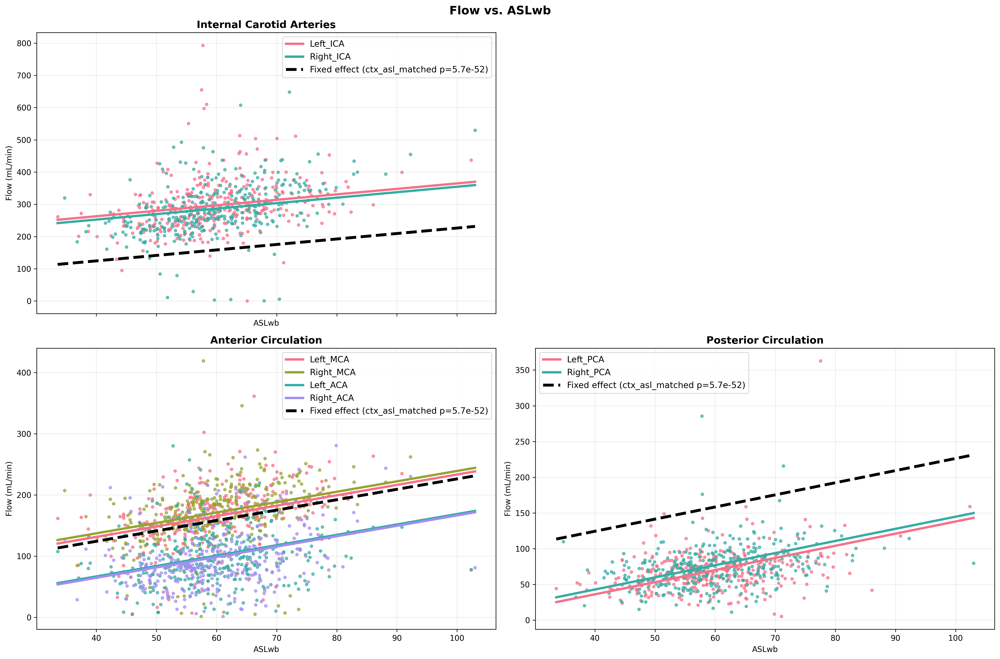

In [332]:
asl_wb_model_path = MODELS_DIR / "perfusion_h_mm" / "asl_wb_aging_mm.pkl"

res, df_fit = fit_or_load_mixedlm(
    asl_wb_model_path,
    fit_fn=_fit_mixedlm,
    load_fn=_load_mixedlm,
    df=flow_long_asl_h,
    outcome="flow",
    overwrite=False,
    formula="1 + ctx_asl_matched + vessel_laterality + age_c + sex",
    re_formula="1",
    re_groups_name="vessel",
    vc_formula={"participant": "0 + C(patient_id)"},
)

print_mixedlm_summary(
    res,
    outcome_name='Flow',
    group_name='vessel',
    vc_group_name='participant',
    output_path=MODELS_DIR / "perfusion_h_mm" / "asl_wb_aging_mm_summary.txt"
)

plot_mixedlm_conditional_fits(
    df_fit=df_fit,
    res=res,
    x_var_data='ctx_asl_matched',
    x_var_model='ctx_asl_matched',
    group_var='vessel',
    output_path=MODELS_DIR / "perfusion_h_mm" / "asl_wb_aging_mm_conditional_fits.png",
    grouping_dict=VESSEL_GROUPS_ORDER,
    title="Flow vs. ASLwb",
    y_label="Flow (mL/min)",
    x_label="ASLwb",
    # x_center_val=0.0,
    covariate_refs={"age_c": 0.0},
    plot_points=True
)

display(Image(str(MODELS_DIR / "perfusion_h_mm" / "asl_wb_aging_mm_conditional_fits.png")))

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

def calculate_vif(df, predictors):
    """
    Calculates VIF for a given list of predictors in the dataframe.
    """
    # 1. Prepare the subset of data
    X = df[predictors].copy()
    
    # 2. Encode categorical variables
    # Vessel_laterality becomes 0 for Left, 1 for Right.
    X = pd.get_dummies(X, drop_first=True)
    
    # 3. Add a constant (intercept) - VIF requires this! Why?
    X = add_constant(X)
    X = X.astype(float)
    
    # 4. Calculate VIF for each column
    vif_data = pd.DataFrame()
    vif_data["feature"] = X.columns
    vif_data["VIF"] = [variance_inflation_factor(X.values, i) 
                       for i in range(len(X.columns))]
    
    return vif_data

predictors_to_check = ['ctx_asl_matched', 'vessel_laterality', 'age_c', 'sex']
vif_results = calculate_vif(flow_long_asl_h, predictors_to_check)

print(vif_results)

                   feature        VIF
0                    const  56.691903
1          ctx_asl_matched   1.181798
2                    age_c   1.102303
3                      sex   1.167669
4  vessel_laterality_Right   1.000144


In [338]:
_VESSEL_GROUPING = {
    'TCBF & ICAs':           ['TCBF', 'Left ICA', 'Right ICA'],
    'Anterior circulation':  ['Left MCA', 'Right MCA', 'Left ACA', 'Right ACA', 'Right Communicating', 'Left Communicating'],
    'Posterior circulation': ['Basilar', 'Left PCA', 'Right PCA'],
    'Venous drainage':       ['Sagital Sinus', 'Straight Sinus', 'Left Transverse', 'Right Transverse'],
}
_VESSEL_NAME_TO_GROUP = {}
for group, vessels in _VESSEL_GROUPING.items():
    for vessel in vessels:
        _VESSEL_NAME_TO_GROUP[vessel] = group

# Polar plot vessel layout configuration
# Defines the angular position and ring (radius) for each vessel in the polar plot
_POLAR_VESSEL_LAYOUT = {
    # Center point
    'TCBF': {'angle': 0, 'ring': 0, 'abbrev': 'TCBF'},
    
    # Ring 1: ICAs (innermost, mirrored)
    'Left ICA': {'angle': 90, 'ring': 1, 'abbrev': 'LICA'},
    'Right ICA': {'angle': -90, 'ring': 1, 'abbrev': 'RICA'},
    
    # Ring 2: Basilar (center bottom)
    'Basilar': {'angle': 180, 'ring': 2, 'abbrev': 'BASI'},
    
    # Ring 3: Communicating vessels only
    # 'Communicating': {'angle': 180, 'ring': 3, 'abbrev': 'COMM'},  # Bottom center
    'Right Communicating': {'angle': -112.5, 'ring': 3, 'abbrev': 'RCOMM'},  # Right side
    'Left Communicating': {'angle': 112.5, 'ring': 3, 'abbrev': 'LCOMM'},  # Left side
    
    # Ring 4: ACAs (top), MCAs (middle), PCAs (bottom)
    'Left MCA': {'angle': 90, 'ring': 4, 'abbrev': 'LMCA'},  # Top left
    'Right MCA': {'angle': -90, 'ring': 4, 'abbrev': 'RMCA'},  # Top right
    'Left ACA': {'angle': 45, 'ring': 4, 'abbrev': 'LACA'},  # Upper middle left
    'Right ACA': {'angle': -45, 'ring': 4, 'abbrev': 'RACA'},  # Upper middle right
    'Left PCA': {'angle': 135, 'ring': 4, 'abbrev': 'LPCA'},  # Bottom left
    'Right PCA': {'angle': -135, 'ring': 4, 'abbrev': 'RPCA'},  # Bottom right
    
    # Ring 5: Straight Sinus - at bottom
    'Straight Sinus': {'angle': 180, 'ring': 5, 'abbrev': 'STRV'},
    
    # Ring 6: Venous system - at bottom
    'Sagital Sinus': {'angle': 180, 'ring': 6, 'abbrev': 'SSSV'},  # Bottom center
    'Right Transverse': {'angle': -120, 'ring': 6, 'abbrev': 'RTSV'},  # Bottom left
    'Left Transverse': {'angle': 120, 'ring': 6, 'abbrev': 'LTSV'},  # Bottom right
}

# Ring radii (normalized, from 0 to 1)
_POLAR_RING_RADII = {
    0: 0.05,   # Center (TCBF) 
    1: 0.15,   # ICAs 
    2: 0.25,   # Basilar 
    3: 0.35,   # Communicating vessels only
    4: 0.45,   # ACAs (top), MCAs (middle), PCAs (bottom)
    5: 0.65,   # Straight Sinus
    6: 0.85,   # Venous system
}


def _calculate_polar_boundaries(vessel_name: str, ring: int, angle_deg: float):
    """
    Calculate angular boundaries (theta_start, theta_end) for a vessel in a polar plot.
    
    Args:
        vessel_name: Name of the vessel
        ring: Ring number
        angle_deg: Center angle in degrees
        
    Returns:
        Tuple of (theta_start, theta_end) in radians
    """
    # Special handling for ring 5 (STRV) - should cover same space as SSSV
    if ring == 5:
        # STRV should cover same angular width as SSSV (120 degrees)
        angular_width = 60 
        angle_rad = np.deg2rad(angle_deg)
        theta_start = angle_rad - np.deg2rad(angular_width / 2)
        theta_end = angle_rad + np.deg2rad(angular_width / 2)
        return theta_start, theta_end
    
    # Special handling for ring 3 (Communicating vessels)
    if ring == 3 and vessel_name in ['Communicating', 'Right Communicating', 'Left Communicating']:
        # Get all Communicating vessels in this ring
        comm_vessels = [(v, l['angle']) for v, l in _POLAR_VESSEL_LAYOUT.items() 
                       if l['ring'] == ring]
        if len(comm_vessels) == 1:
            # Single vessel gets a reasonable angular width
            angular_width = 25
            angle_rad = np.deg2rad(angle_deg)
            theta_start = angle_rad - np.deg2rad(angular_width / 2)
            theta_end = angle_rad + np.deg2rad(angular_width / 2)
            return theta_start, theta_end
        else:
            # Each vessel with a small angl
            angular_width = 25
            angle_rad = np.deg2rad(angle_deg)
            theta_start = angle_rad - np.deg2rad(angular_width / 2)
            theta_end = angle_rad + np.deg2rad(angular_width / 2)
            return theta_start, theta_end
    
    # Get all vessels in this ring with their angles
    vessels_in_ring = [(v, l['angle']) for v, l in _POLAR_VESSEL_LAYOUT.items() 
                      if l['ring'] == ring]
    vessels_in_ring.sort(key=lambda x: x[1])  # Sort by angle
    
    # Find this vessel's position in the sorted list
    vessel_idx = None
    for idx, (v, a) in enumerate(vessels_in_ring):
        if v == vessel_name:
            vessel_idx = idx
            break
    
    if vessel_idx is None or len(vessels_in_ring) == 0:
        # Fallback to equal division
        angular_width = 360 / len(vessels_in_ring) if vessels_in_ring else 30
        angle_rad = np.deg2rad(angle_deg)
        theta_start = angle_rad - np.deg2rad(angular_width / 2)
        theta_end = angle_rad + np.deg2rad(angular_width / 2)
        return theta_start, theta_end
    
    # Calculate boundaries based on adjacent vessels
    n_vessels = len(vessels_in_ring)
    
    # Special handling for single-vessel rings (e.g., Basilar in Ring 2)
    if n_vessels == 1:
        # Single vessel gets a reasonable angular width (e.g., 60 degrees)
        angular_width = 60
        angle_rad = np.deg2rad(angle_deg)
        theta_start = angle_rad - np.deg2rad(angular_width / 2)
        theta_end = angle_rad + np.deg2rad(angular_width / 2)
        return theta_start, theta_end
    
    # Get previous and next vessel angles
    prev_angle = vessels_in_ring[(vessel_idx - 1) % n_vessels][1]
    next_angle = vessels_in_ring[(vessel_idx + 1) % n_vessels][1]
    
    # Handle wrap-around (angles can cross 180/-180 boundary)
    # Convert all angles to 0-360 range for easier calculation
    def normalize_angle(angle):
        """Normalize angle to 0-360 range"""
        while angle < 0:
            angle += 360
        while angle >= 360:
            angle -= 360
        return angle
    
    current_angle_norm = normalize_angle(angle_deg)
    prev_angle_norm = normalize_angle(prev_angle)
    next_angle_norm = normalize_angle(next_angle)
    
    # Calculate midpoint between previous and current
    if prev_angle_norm > current_angle_norm:
        # Wrap around case
        midpoint_prev = (prev_angle_norm + current_angle_norm + 360) / 2
        if midpoint_prev >= 360:
            midpoint_prev -= 360
    else:
        midpoint_prev = (prev_angle_norm + current_angle_norm) / 2
    
    # Calculate midpoint between current and next
    if next_angle_norm < current_angle_norm:
        # Wrap around case
        midpoint_next = (current_angle_norm + next_angle_norm + 360) / 2
        if midpoint_next >= 360:
            midpoint_next -= 360
    else:
        midpoint_next = (current_angle_norm + next_angle_norm) / 2
    
    # Convert back to -180 to 180 range for polar plot
    def to_polar_range(angle):
        """Convert 0-360 to -180 to 180 range"""
        if angle > 180:
            return angle - 360
        return angle
    
    theta_start = np.deg2rad(to_polar_range(midpoint_prev))
    theta_end = np.deg2rad(to_polar_range(midpoint_next))
    
    # Ensure theta_end > theta_start (handle wrap-around)
    if theta_end < theta_start:
        theta_end += 2 * np.pi
    
    return theta_start, theta_end

def plot_polar_flow(
    patient_flow_data,
    patient_id: str,
    feature_name: str = 'Flow',
    output_path = None,
    figsize = None,
    cmap: str = 'hot',
    vmin = None,
    vmax = None,
    use_abs: bool = True,
) -> plt.Figure:
    """
    Create a polar plot showing feature values for each vessel section.
    
    Args:
        patient_flow_data: Dictionary {vessel_name: feature_value}
        patient_id: Patient identifier for title
        feature_name: Name of the feature being plotted (e.g., 'Flow', 'PI')
        output_path: Optional path to save figure
        figsize: Optional figure size (default: (10, 10))
        cmap: Colormap name (default: 'hot')
        vmin: Minimum value for color scale (default: min of data, excluding TCBF)
        vmax: Maximum value for color scale (default: max of data, excluding TCBF)
        
    Returns:
        matplotlib Figure
    """
    if figsize is None:
        figsize = (10, 10)
    
    # Create figure with polar projection
    fig = plt.figure(figsize=figsize)
    ax = plt.subplot(111, projection='polar')
    
    # Get colormap (use a fixed palette for consistent scaling)
    if cmap is None or str(cmap).lower() in ["custom_hot_no_green", "custom"]:
        from matplotlib.colors import LinearSegmentedColormap
        color_map = LinearSegmentedColormap.from_list(
            "custom_hot_no_green",
            [
                (1, 1, 1),      # White
                (1, 1, 0),      # Light Yellow
                (1, 0.5, 0),    # Orange
                (1, 0, 0),      # Red
            ],
            N=1024,
        )
    else:
        try:
            from matplotlib import colormaps
            color_map = colormaps[cmap]
        except (ImportError, AttributeError):
            color_map = plt.cm.get_cmap(cmap)
    
    # Determine color scale - exclude TCBF from min/max calculation
    flow_values = [v for k, v in patient_flow_data.items() 
                   if v is not None and np.isfinite(v) and k != 'TCBF']
    if not flow_values:
        raise ValueError(f"No valid data for patient {patient_id}")

    if use_abs:
        flow_values = np.abs(flow_values)
        patient_flow_data = {k: np.abs(v) for k, v in patient_flow_data.items()}
    
    if vmin is None:
        vmin = min(flow_values)
    if vmax is None:
        vmax = max(flow_values)
    
    # Get TCBF value for text display
    tcbf_value = patient_flow_data.get('TCBF', None)
    
    # Normalize function
    def normalize(value):
        if value is None or not np.isfinite(value):
            return None
        if vmax == vmin:
            return 0.5
        return (value - vmin) / (vmax - vmin)
    
    # Plot each vessel section
    for vessel_name, flow_value in patient_flow_data.items():
        if vessel_name not in _POLAR_VESSEL_LAYOUT:
            continue
        
        layout = _POLAR_VESSEL_LAYOUT[vessel_name]
        angle_deg = layout['angle']
        ring = layout['ring']
        abbrev = layout['abbrev']
        
        # Convert angle to radians
        angle_rad = np.deg2rad(angle_deg)
        
        # Get radius for this ring
        radius = _POLAR_RING_RADII.get(ring, 0.5)
        
        # Determine color
        if flow_value is None or not np.isfinite(flow_value):
            # Missing vessel: black
            color = 'black'
            alpha = 0.5
        else:
            # Normalize and get color
            # if vmax > 100: 
            norm_val = normalize(flow_value)
            color = color_map(norm_val)
            # else:
            #     # BoundaryNorm to colormap
            #     from matplotlib.colors import BoundaryNorm
            #     norm = BoundaryNorm(np.linspace(vmin, vmax, color_map.N), ncolors=color_map.N)
            #     color = color_map(norm(flow_value))
            #     # color = color_map(flow_value)
            alpha = 1.0
        
        # Calculate section width (angular width for each section)
        # For center point (TCBF), use small circular ring
        if ring == 0:
            # Center circle for TCBF - use fill_between with full 360 degrees
            theta_center = np.linspace(0, 2*np.pi, 100)
            ax.fill_between(theta_center, 0, radius, color=color, alpha=alpha, zorder=10)
            
            # Add red frame around TCBF (arterial)
            frame_color = 'red'
            frame_width = 2.0
            ax.plot(theta_center, [radius] * len(theta_center), color=frame_color, linewidth=frame_width, zorder=11)
            
            # Add label at center with value below
            norm_val_check = normalize(flow_value) if flow_value is not None else None
            ax.text(0, radius/2, abbrev, ha='center', va='center', 
                   fontsize=10, fontweight='bold', 
                   color='white' if (norm_val_check is not None and norm_val_check > 0.5) else 'black',
                   zorder=12)
            # Add TCBF value as text below the name
            if tcbf_value is not None and np.isfinite(tcbf_value):
                if 'flow' in feature_name.lower():
                    value_str = f'{tcbf_value:.1f}'
                else:
                    value_str = f'{tcbf_value:.2f}'
                ax.text(0, radius/3, value_str, ha='center', va='center',
                       fontsize=8, color='white' if (norm_val_check is not None and norm_val_check > 0.5) else 'black',
                       zorder=12)
        else:
            # Calculate angular boundaries based on adjacent vessels
            theta_start, theta_end = _calculate_polar_boundaries(vessel_name, ring, angle_deg)
            
            # Inner and outer radii for this ring
            if ring > 0:
                prev_ring = max([r for r in _POLAR_RING_RADII.keys() if r < ring], default=0)
                r_inner = _POLAR_RING_RADII.get(prev_ring, 0)
            else:
                r_inner = 0
            r_outer = radius
            
            # Draw wedge using fill_between
            theta_wedge = np.linspace(theta_start, theta_end, 50)
            ax.fill_between(theta_wedge, r_inner, r_outer, color=color, alpha=alpha, zorder=ring)
            
            # Add colored frame based on vessel group (venous = blue, arterial = red)
            group = _VESSEL_NAME_TO_GROUP.get(vessel_name, 'Unknown')
            if group == 'Venous drainage':
                frame_color = 'blue'
            else:
                frame_color = 'red'  # All arterial vessels (TCBF & ICAs, Anterior, Posterior)
            
            # Draw frame as outline around the wedge
            frame_width = 2.0
            # Draw outer edge
            ax.plot(theta_wedge, [r_outer] * len(theta_wedge), color=frame_color, linewidth=frame_width, zorder=ring+5)
            # Draw inner edge (if not at center)
            if r_inner > 0:
                ax.plot(theta_wedge, [r_inner] * len(theta_wedge), color=frame_color, linewidth=frame_width, zorder=ring+5)
            # Draw side edges
            ax.plot([theta_start, theta_start], [r_inner, r_outer], color=frame_color, linewidth=frame_width, zorder=ring+5)
            ax.plot([theta_end, theta_end], [r_inner, r_outer], color=frame_color, linewidth=frame_width, zorder=ring+5)
            
            # Add label at center of wedge
            label_angle = angle_rad
            label_radius = (r_inner + r_outer) / 2
            norm_val_check = normalize(flow_value) if flow_value is not None else None
            ax.text(label_angle, label_radius, abbrev, 
                   ha='center', va='center', fontsize=9, 
                   fontweight='bold', 
                   color='white' if (norm_val_check is not None and norm_val_check > 0.5) else 'black',
                   zorder=ring+10)
    
    # Customize plot
    ax.set_theta_zero_location('N')  # 0 degrees at top
    ax.set_theta_direction(-1)  # Clockwise
    ax.set_ylim(0, 1)
    ax.set_yticklabels([])  # Remove radius labels
    ax.set_xticklabels([])  # Remove angle labels
    ax.spines['polar'].set_visible(False)
    ax.grid(False)  # Remove background grid
    
    # Add title
    if 'flow' in feature_name.lower():
        unit = 'mL/min'
    elif 'pi' in feature_name.lower() or 'pulsatility' in feature_name.lower():
        unit = 'PI'
    else:
        unit = ''
    plt.title(f'Polar {feature_name} Map: {patient_id}\n{unit}', 
             fontsize=14, fontweight='bold', pad=20)
    
    # Add colorbar
    sm = plt.cm.ScalarMappable(cmap=color_map, 
                              norm=plt.Normalize(vmin=vmin, vmax=vmax))
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, pad=0.1, shrink=0.8)
    cbar.set_label(unit, rotation=270, labelpad=20)
    
    plt.tight_layout()
    
    if output_path:
        fig.savefig(output_path, dpi=300, bbox_inches='tight')
    
    return fig

def calculate_asl_coupling_map(df):
    coupling_results = {}
    
    # We use the vessels defined in your POLAR_VESSEL_LAYOUT
    for vessel in _POLAR_VESSEL_LAYOUT.keys():
        # Filter for the specific vessel
        v_data = df[df['vessel'] == vessel.replace(' ', '_')] # Match naming convention
        
        if len(v_data) > 10: # Ensure enough data points for a correlation
            # Calculate correlation between flow value and matched ASL
            r_val = v_data['value'].corr(v_data['ctx_asl_matched'])
            coupling_results[vessel] = r_val
        else:
            coupling_results[vessel] = np.nan
            
    return coupling_results

vessel_asl_coupling = calculate_asl_coupling_map(flow_long_asl_h)
vessel_asl_coupling

{'TCBF': nan,
 'Left ICA': np.float64(0.3050665772409496),
 'Right ICA': np.float64(0.4273974579976744),
 'Basilar': nan,
 'Right Communicating': nan,
 'Left Communicating': nan,
 'Left MCA': np.float64(0.40713896258076476),
 'Right MCA': np.float64(0.38812917473156106),
 'Left ACA': np.float64(0.17902108965761912),
 'Right ACA': np.float64(0.32298602273790866),
 'Left PCA': np.float64(0.29854203899813503),
 'Right PCA': np.float64(0.3263260221146568),
 'Straight Sinus': nan,
 'Sagital Sinus': nan,
 'Right Transverse': nan,
 'Left Transverse': nan}

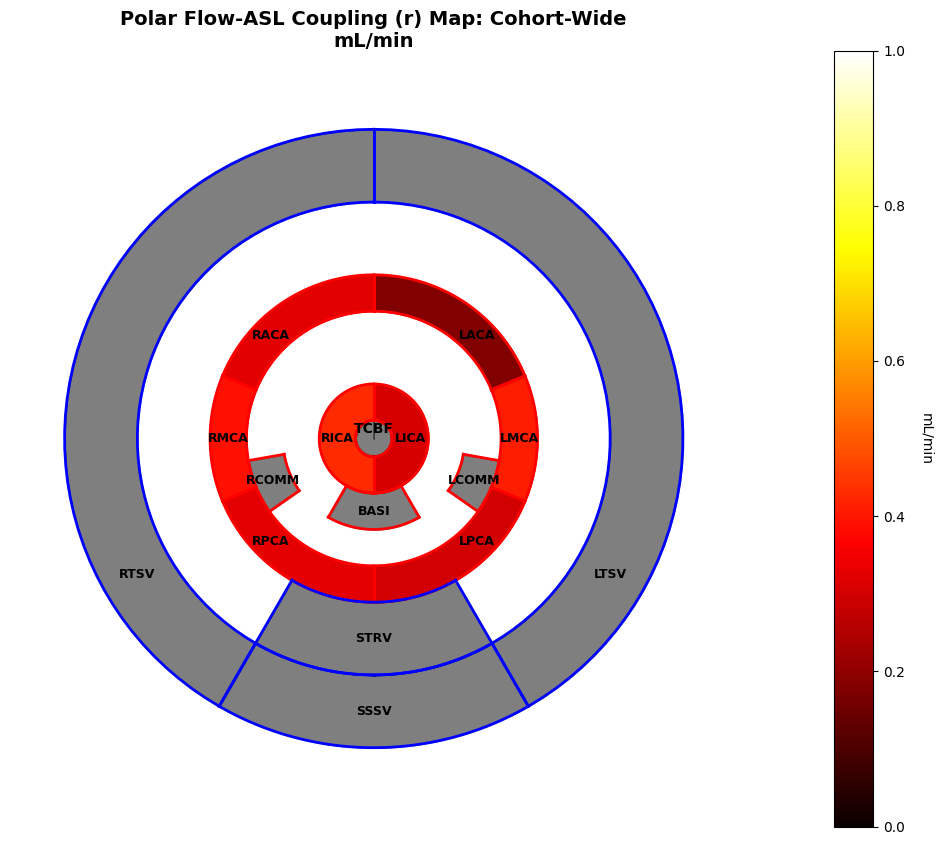

In [340]:
# Create the figure
fig = plot_polar_flow(
    patient_flow_data=vessel_asl_coupling,
    patient_id="Cohort-Wide",
    feature_name="Flow-ASL Coupling (r)",
    # cmap="viridis", 
    vmin=0.0, 
    vmax=1.0, # Correlation scale
    use_abs=False
)

plt.show()

## 2.7. Flow ~ 1 + PLCany + PLCvol + age_c + sex + (1|vessel) + (1|participant)

In [9]:
EXCLUDE_FOR_MIXEDLM_ASL = {
    "TCBF", 'Left_Communicating', 'Right_Communicating', 
    'Basilar', 'Left_PC', 'Right_PC', 'Left_MCA', 'Right_MCA', 'Rigth_MCA', 'Left_MCA'
    'Straight_Sinus', 'Sagital_Sinus', 'Right_Transverse', 'Left_Transverse'
    }

flow_long_plaque_carotides = build_long_vessel_df(
    clinical_df, flow_table, 
    outcome_label="Flow (mL/min)", exclude_vessels=EXCLUDE_FOR_MIXEDLM_ASL, 
    column_names=["patient_id", "age_at_mri", "sex", "hematocrit", "plaque_left_carotid", "plaque_right_carotid"]
)

flow_long_plaque_carotides['plaque_vol'] = np.nan
flow_long_plaque_carotides.loc[flow_long_plaque_carotides['vessel'] == 'Left_ICA', 'plaque_vol'] = flow_long_plaque_carotides['plaque_left_carotid']
flow_long_plaque_carotides.loc[flow_long_plaque_carotides['vessel'] == 'Right_ICA', 'plaque_vol'] = flow_long_plaque_carotides['plaque_right_carotid']

flow_long_plaque_carotides['plaque_any'] = np.where(flow_long_plaque_carotides['plaque_vol'] > 0, 1, 0)

flow_long_plaque_carotides = flow_long_plaque_carotides.dropna(subset=['plaque_vol'])
flow_long_plaque_carotides = flow_long_plaque_carotides.reset_index(drop=True)


flow_long_plaque_carotides_filtered_20 = flow_long_plaque_carotides.copy()
flow_long_plaque_carotides_filtered_20['plaque_any'] = np.where(flow_long_plaque_carotides_filtered_20['plaque_vol'] > 20, 1, 0)
flow_long_plaque_carotides_filtered_20['plaque_vol'] = np.where(flow_long_plaque_carotides_filtered_20['plaque_vol'] > 20, flow_long_plaque_carotides_filtered_20['plaque_vol'], np.nan)

flow_long_plaque_carotides_filtered_50 = flow_long_plaque_carotides.copy()
flow_long_plaque_carotides_filtered_50['plaque_any'] = np.where(flow_long_plaque_carotides_filtered_50['plaque_vol'] > 50, 1, 0)
flow_long_plaque_carotides_filtered_50['plaque_vol'] = np.where(flow_long_plaque_carotides_filtered_50['plaque_vol'] > 50, flow_long_plaque_carotides_filtered_50['plaque_vol'], np.nan)

print(flow_long_plaque_carotides.head())
print(f'Plaque on {flow_long_plaque_carotides["plaque_any"].sum()} vessels out of {flow_long_plaque_carotides["plaque_any"].count()}')
print(f'Plaque on {flow_long_plaque_carotides_filtered_20["plaque_any"].sum()} vessels out of {flow_long_plaque_carotides_filtered_20["plaque_any"].count()}')
print(f'Plaque on {flow_long_plaque_carotides_filtered_50["plaque_any"].sum()} vessels out of {flow_long_plaque_carotides_filtered_50["plaque_any"].count()}')


     patient_id    vessel       value    age  sex  hematocrit  \
0   PESA1006009  Left_ICA  267.035802  62.87  1.0        47.0   
1  PESA10061584  Left_ICA   94.844843  64.27  1.0        48.0   
2  PESA10067929  Left_ICA  323.586469  64.54  1.0        42.0   
3  PESA10086976  Left_ICA  303.364359  53.19  0.0        45.0   
4  PESA10112400  Left_ICA  325.856177  53.74  1.0        48.0   

   plaque_left_carotid  plaque_right_carotid     age_c        outcome  \
0             0.000000              0.000000  5.078852  Flow (mL/min)   
1             0.000000              0.000000  6.478852  Flow (mL/min)   
2            10.015992              0.000000  6.748852  Flow (mL/min)   
3             0.000000              0.000000 -4.601148  Flow (mL/min)   
4             0.000000             12.492144 -4.051148  Flow (mL/min)   

   plaque_vol  plaque_any  
0    0.000000           0  
1    0.000000           0  
2   10.015992           1  
3    0.000000           0  
4    0.000000           0  
Pl

In [ ]:
# from sklearn.linear_model import LinearRegression
import statsmodels.api as sm


flow_long_plaque_carotides_R = flow_long_plaque_carotides[flow_long_plaque_carotides['vessel'] == 'Right_ICA']
flow_long_plaque_carotides_L = flow_long_plaque_carotides[flow_long_plaque_carotides['vessel'] == 'Left_ICA']

flow_long_plaque_carotides_R_x = flow_long_plaque_carotides_R[['plaque_vol', 'age_c', 'sex']]
flow_long_plaque_carotides_R_y = flow_long_plaque_carotides_R['value'].ravel()

flow_long_plaque_carotides_L_x = flow_long_plaque_carotides_L[['plaque_vol', 'age_c', 'sex']]
flow_long_plaque_carotides_L_y = flow_long_plaque_carotides_L['value'].ravel()

# flow_long_plaque_carotides_R_x['plaque_vol_log'] = np.log(flow_long_plaque_carotides_R_x['plaque_vol'] + 1)
# flow_long_plaque_carotides_L_x['plaque_vol_log'] = np.log(flow_long_plaque_carotides_L_x['plaque_vol'] + 1)

# flow_long_plaque_carotides_R_x.drop(columns=['plaque_vol'], inplace=True)
# flow_long_plaque_carotides_L_x.drop(columns=['plaque_vol'], inplace=True)

# model_r = LinearRegression().fit(flow_long_plaque_carotides_R_x, flow_long_plaque_carotides_R_y)
# model_l = LinearRegression().fit(flow_long_plaque_carotides_L_x, flow_long_plaque_carotides_L_y)

# print(model_r.coef_)
# print(model_r.intercept_)
# print(model_l.coef_)
# print(model_l.intercept_)

flow_long_plaque_carotides_R_x = sm.add_constant(flow_long_plaque_carotides_R_x)
flow_long_plaque_carotides_L_x = sm.add_constant(flow_long_plaque_carotides_L_x)

model_r = sm.OLS(flow_long_plaque_carotides_R_y, flow_long_plaque_carotides_R_x).fit()
model_l = sm.OLS(flow_long_plaque_carotides_L_y, flow_long_plaque_carotides_L_x).fit()

print(model_r.summary())
print(model_l.summary())



                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.035
Model:                            OLS   Adj. R-squared:                  0.026
Method:                 Least Squares   F-statistic:                     4.137
Date:                jue, 05 mar 2026   Prob (F-statistic):            0.00670
Time:                        12:17:52   Log-Likelihood:                -2026.2
No. Observations:                 349   AIC:                             4060.
Df Residuals:                     345   BIC:                             4076.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        289.2209      7.761     37.265      0.0

: 

In [ ]:
asl_wb_model_path = MODELS_DIR / "plaque_icas_mm" / "plaque_icas_vol_mm.pkl"

res, df_fit = fit_or_load_mixedlm(
    asl_wb_model_path,
    fit_fn=_fit_mixedlm,
    load_fn=_load_mixedlm,
    df=flow_long_plaque_carotides,
    outcome="flow",
    overwrite=True,
    formula="1 + plaque_any + plaque_vol + age_c + sex",
    re_formula="1 + plaque_any + plaque_vol",
    re_groups_name="vessel",
    vc_formula={"participant": "0 + C(patient_id)"},
)

print_mixedlm_summary(
    res,
    outcome_name='Flow',
    group_name='vessel',
    vc_group_name='participant',
    output_path=MODELS_DIR / "plaque_icas_mm" / "plaque_icas_vol_mm_summary.txt"
)


Fitting model and saving to /data_local/LabVF/PESA-Brain/RESULTS/Preliminary B1/clinical/mm_models/plaque_icas_mm/plaque_icas_vol_mm.pkl


  Mixed Linear Model - Flow

MODEL FORMULA:
  flow ~ 1 + plaque_vol + age_c + sex

MODEL INFORMATION:
  Observations: 698
  Number of vessel groups: 2
  Optimization method: REML

--------------------------------------------------------------------------------
FIXED EFFECTS (Population-Level Parameters):
--------------------------------------------------------------------------------
Parameter                         Coef      Std.Err      P-value    Sig
--------------------------------------------------------------------------------
Intercept                     297.7484      10.6460   3.958e-172    ***
plaque_vol                     -0.0344      22.2776       0.9988     NS
age_c                          -2.8014       0.6717     3.04e-05    ***
sex                           -10.0465       6.5615       0.1257     NS

Significance: *** <0.001  ** <0.01  * <0.05  . <0.1

--------------------------------------------------------------------------------
VESSEL RANDOM EFFECTS (from re_formul

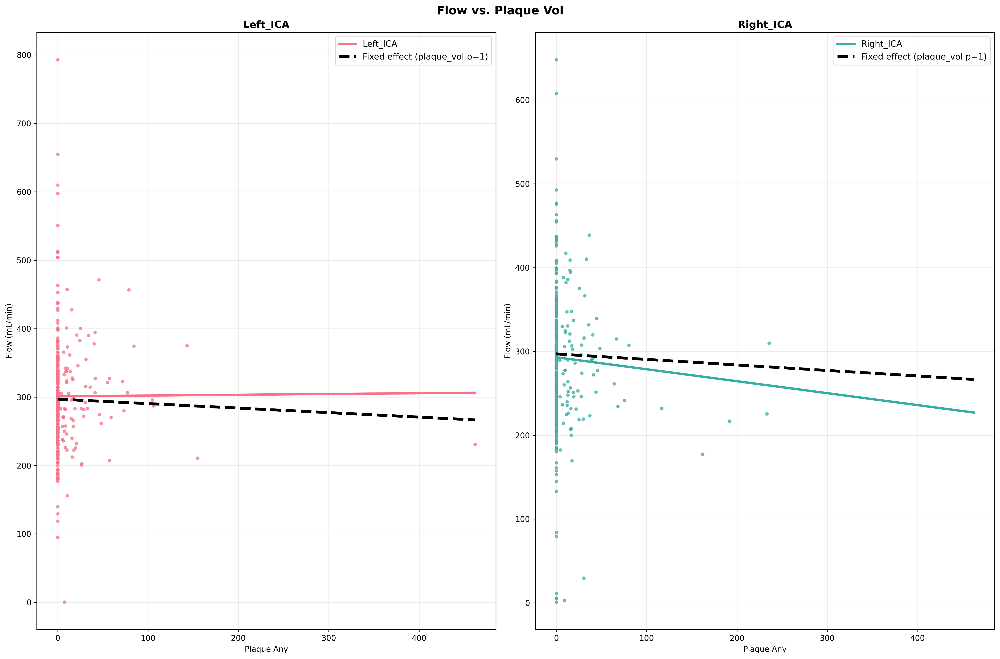

In [244]:
plot_mixedlm_conditional_fits(
    df_fit=df_fit,
    res=res,
    x_var_data='plaque_vol',
    x_var_model='plaque_vol',
    group_var='vessel',
    output_path=MODELS_DIR / "plaque_icas_mm" / "plaque_icas_vol_mm_conditional_fits.png",
    grouping_dict=None,
    title="Flow vs. Plaque Vol",
    y_label="Flow (mL/min)",
    x_label="Plaque Any",
    # x_center_val=0.0,
    covariate_refs={"age_c": 0.0},
    plot_points=True
)

display(Image(str(MODELS_DIR / "plaque_icas_mm" / "plaque_icas_vol_mm_conditional_fits.png")))

### 3. Dynamic Models

In [248]:
import seaborn as sns
from scipy.optimize import curve_fit
import skfda # Functional Data Analysis library


In [249]:
flow_ts_long

,patient_id,vessel,vessel_code,frame,flow,phase,ctx_right_hemisphere,sys_dias_delta,bpxdim,weight,...,bpxpls,height,ctx_left_hemisphere,sex,plaque_right_carotid,tad,plaque_left_carotid,ctx_whole_brain,age_at_mri,bmi
0,PESA1006009,Left ICA,LICA,0,252.617741,0.000000,66.288385,49.0,75.0,78.0,...,62.0,167.0,63.393821,1.0,0.0,73.0,0.0,64.850706,62.87,27.968016
1,PESA1006009,Left ICA,LICA,1,227.585850,0.071429,66.288385,49.0,75.0,78.0,...,62.0,167.0,63.393821,1.0,0.0,73.0,0.0,64.850706,62.87,27.968016
2,PESA1006009,Left ICA,LICA,2,217.659688,0.142857,66.288385,49.0,75.0,78.0,...,62.0,167.0,63.393821,1.0,0.0,73.0,0.0,64.850706,62.87,27.968016
3,PESA1006009,Left ICA,LICA,3,215.417776,0.214286,66.288385,49.0,75.0,78.0,...,62.0,167.0,63.393821,1.0,0.0,73.0,0.0,64.850706,62.87,27.968016
4,PESA1006009,Left ICA,LICA,4,201.988692,0.285714,66.288385,49.0,75.0,78.0,...,62.0,167.0,63.393821,1.0,0.0,73.0,0.0,64.850706,62.87,27.968016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73900,PESA9972964,TCBF,TCBF,10,987.142467,0.714286,62.464305,35.0,74.0,56.5,...,55.0,171.0,61.776127,0.0,0.0,65.0,0.0,62.120475,53.65,19.322185
73901,PESA9972964,TCBF,TCBF,11,1014.175444,0.785714,62.464305,35.0,74.0,56.5,...,55.0,171.0,61.776127,0.0,0.0,65.0,0.0,62.120475,53.65,19.322185
73902,PESA9972964,TCBF,TCBF,12,1002.189646,0.857143,62.464305,35.0,74.0,56.5,...,55.0,171.0,61.776127,0.0,0.0,65.0,0.0,62.120475,53.65,19.322185
73903,PESA9972964,TCBF,TCBF,13,869.828267,0.928571,62.464305,35.0,74.0,56.5,...,55.0,171.0,61.776127,0.0,0.0,65.0,0.0,62.120475,53.65,19.322185


In [ ]:
# flow_ts_wide.columns = [f'f{c}' if isinstance(c, int) else c for c in flow_ts_wide.columns]
frame_cols = [c for c in flow_ts_wide.columns if c.startswith('f')]
time_points = np.arange(15) # 0 to 14

In [290]:
flow_ts_wide

,patient_id,vessel,vessel_code,age_at_mri,sex,bmi,weight,height,hematocrit,bpxsym,...,f7,f8,f9,f10,f11,f12,f13,f14,PC1_Magnitude,PC2_Pulsatility
0,PESA1006009,Basilar,BASI,62.87,1.0,27.968016,78.0,167.0,47.0,124.0,...,160.840273,252.938347,266.397772,262.681961,237.725158,188.848443,191.011362,189.220390,-86.605442,72.158016
1,PESA1006009,Left ACA,LACA,62.87,1.0,27.968016,78.0,167.0,47.0,124.0,...,96.976891,150.563221,169.693065,166.880980,158.196101,130.403194,124.440322,123.174362,-324.195033,33.639695
2,PESA1006009,Left ICA,LICA,62.87,1.0,27.968016,78.0,167.0,47.0,124.0,...,225.327344,367.114534,373.405952,368.191252,343.306303,284.935713,283.840456,264.153757,229.023836,84.692000
3,PESA1006009,Left MCA,LMCA,62.87,1.0,27.968016,78.0,167.0,47.0,124.0,...,143.241320,246.581469,253.717346,256.524439,242.574377,197.375464,195.805535,177.284031,-88.028732,49.241832
4,PESA1006009,Left PCA,LPCA,62.87,1.0,27.968016,78.0,167.0,47.0,124.0,...,63.982408,113.264236,121.442585,123.644414,109.093215,97.553937,80.561221,97.342601,-467.230845,30.983261
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4792,PESA9972964,Right PCA,RPCA,53.65,0.0,19.322185,56.5,171.0,41.0,109.0,...,75.004628,84.418058,103.258145,157.761583,149.847407,153.542705,138.528886,132.937260,-350.358868,-52.679372
4793,PESA9972964,Right Transverse,RTSV,53.65,0.0,19.322185,56.5,171.0,41.0,109.0,...,73.821259,67.044060,79.758067,100.106213,116.136246,118.236308,108.490698,99.025147,-441.667337,-31.993284
4794,PESA9972964,Sagital Sinus,SSSV,53.65,0.0,19.322185,56.5,171.0,41.0,109.0,...,275.544004,268.131552,291.948709,356.593580,396.678743,418.609200,392.719746,374.781504,458.767349,-134.483684
4795,PESA9972964,Straight Sinus,STRV,53.65,0.0,19.322185,56.5,171.0,41.0,109.0,...,54.955616,59.211398,64.498208,64.958110,78.313208,80.731587,76.291730,71.346781,-542.009789,-6.916789


### Waveforms

In [306]:
flow_ts_wide

,patient_id,vessel,vessel_code,age_at_mri,sex,bmi,weight,height,hematocrit,bpxsym,...,f5,f6,f7,f8,f9,f10,f11,f12,f13,f14
0,PESA1006009,Basilar,BASI,62.87,1.0,27.968016,78.0,167.0,47.0,124.0,...,130.361080,120.433002,160.840273,252.938347,266.397772,262.681961,237.725158,188.848443,191.011362,189.220390
1,PESA1006009,Left ACA,LACA,62.87,1.0,27.968016,78.0,167.0,47.0,124.0,...,91.200171,91.744215,96.976891,150.563221,169.693065,166.880980,158.196101,130.403194,124.440322,123.174362
2,PESA1006009,Left ICA,LICA,62.87,1.0,27.968016,78.0,167.0,47.0,124.0,...,193.813677,186.178293,225.327344,367.114534,373.405952,368.191252,343.306303,284.935713,283.840456,264.153757
3,PESA1006009,Left MCA,LMCA,62.87,1.0,27.968016,78.0,167.0,47.0,124.0,...,124.708729,126.308742,143.241320,246.581469,253.717346,256.524439,242.574377,197.375464,195.805535,177.284031
4,PESA1006009,Left PCA,LPCA,62.87,1.0,27.968016,78.0,167.0,47.0,124.0,...,61.915970,52.655289,63.982408,113.264236,121.442585,123.644414,109.093215,97.553937,80.561221,97.342601
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4792,PESA9972964,Right PCA,RPCA,53.65,0.0,19.322185,56.5,171.0,41.0,109.0,...,90.826857,85.164557,75.004628,84.418058,103.258145,157.761583,149.847407,153.542705,138.528886,132.937260
4793,PESA9972964,Right Transverse,RTSV,53.65,0.0,19.322185,56.5,171.0,41.0,109.0,...,81.508119,85.035467,73.821259,67.044060,79.758067,100.106213,116.136246,118.236308,108.490698,99.025147
4794,PESA9972964,Sagital Sinus,SSSV,53.65,0.0,19.322185,56.5,171.0,41.0,109.0,...,293.542356,281.895618,275.544004,268.131552,291.948709,356.593580,396.678743,418.609200,392.719746,374.781504
4795,PESA9972964,Straight Sinus,STRV,53.65,0.0,19.322185,56.5,171.0,41.0,109.0,...,63.942418,64.835122,54.955616,59.211398,64.498208,64.958110,78.313208,80.731587,76.291730,71.346781


F(t)=A0​+A1​cos(152πt​−ϕ1​)+A2​cos(154πt​−ϕ2​)

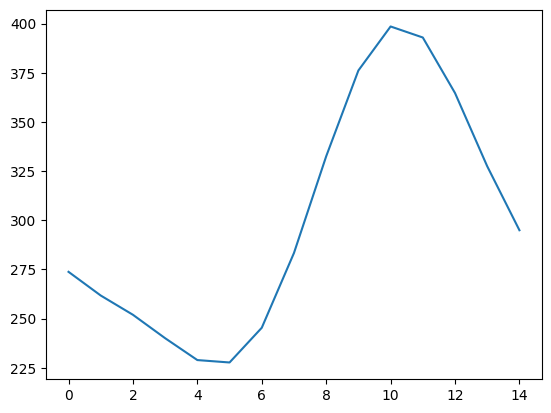

In [330]:
def harmonic_model(t, A0, A1, phi1, A2, phi2):
    w = 2 * np.pi / 15 # Fundamental frequency for 15 frames
    return A0 + A1 * np.cos(w * t - phi1) + A2 * np.cos(2 * w * t - phi2)

p0 = [300, 80, 4.5, 22.5, 2]
plt.plot(time_points, harmonic_model(time_points, *p0))

In [326]:
def get_population_vessel_parameters(df, frames_range=range(15)):
    t_raw = np.array(list(frames_range))
    frame_cols = [c for c in df.columns if c.startswith('f') and c not in ['frame']]
    
    # Define the Harmonic Model (A0 = Mean, A1/Phi1 = Primary pulse, A2/Phi2 = Sharpness)
    def harmonic_func(t, A0, A1, phi1, A2, phi2):
        w = 2 * np.pi / 15 
        return A0 + A1 * np.cos(w * t - phi1) + A2 * np.cos(2 * w * t - phi2)

    # 1. Aggregate: Calculate the mean wave for each vessel across all participants
    vessel_means = df.groupby('vessel')[frame_cols].mean().reset_index()

    population_results = []

    for idx, row in vessel_means.iterrows():
        y_pop = row[frame_cols].values
        
        # Initial guess based on the population mean wave
        p0 = [np.mean(y_pop), (np.max(y_pop)-np.min(y_pop))/2, 3, (np.max(y_pop)-np.min(y_pop))/4, 1]
        
        try:
            popt, _ = curve_fit(harmonic_func, t_raw, y_pop, p0=p0, maxfev=5000)
            population_results.append({
                'vessel': row['vessel'],
                'A0_Mean_Flow': popt[0],
                'A1_Pulse_Amplitude': popt[1],
                'Phi1_Phase_Timing': popt[2],
                'A2_Harmonic_Sharpness': popt[3],
                'Phi2_Harmonic_Phase': popt[4],
                'Pulsatility_Index_Proxy': popt[1] / popt[0] # Ratio of pulse strength to mean flow
            })
        except Exception as e:
            print(f"Skipping {row['vessel']} due to fit error: {e}")

    return pd.DataFrame(population_results)

df_parametric_population = get_population_vessel_parameters(flow_ts_wide)
df_parametric_population

,vessel,A0_Mean_Flow,A1_Pulse_Amplitude,Phi1_Phase_Timing,A2_Harmonic_Sharpness,Phi2_Harmonic_Phase,Pulsatility_Index_Proxy
0,Basilar,172.431584,47.441520,4.627409,12.749774,1.978385,0.275132
1,Left ACA,99.440446,25.852563,4.971556,5.231157,2.430853,0.259980
2,Left Communicating,67.432974,17.972836,4.970935,3.570667,2.405206,0.266529
3,Left ICA,296.330475,83.476511,4.644228,22.677864,1.998201,0.281701
4,Left MCA,164.538161,44.655298,4.769045,10.450619,2.072714,0.271398
5,Left PCA,69.278391,19.991846,4.775071,5.282852,2.208812,0.288573
6,Left Transverse,180.983540,-20.913687,2.313419,-4.576754,-0.433730,-0.115556
7,Right ACA,95.501244,25.168481,4.963901,5.662158,2.321996,0.263541
8,Right Communicating,67.723418,18.290992,4.893255,3.804010,2.166946,0.270084
9,Right ICA,284.070334,81.776344,4.633526,23.535127,2.016312,0.287874


51.074677495696825 399.22053450408083


/tmp/ipykernel_225504/1307537533.py:84: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


,vessel,A0_Mean_Flow,A1_Pulse_Amplitude,Phi1_Phase_Timing,A2_Harmonic_Sharpness,Phi2_Harmonic_Phase,Pulsatility_Index_Proxy
0,Basilar,172.431584,47.441520,4.627409,12.749774,1.978385,0.275132
1,Left ACA,99.440446,25.852563,4.971556,5.231157,2.430853,0.259980
2,Left Communicating,67.432974,17.972836,4.970935,3.570667,2.405206,0.266529
3,Left ICA,296.330475,83.476511,4.644228,22.677864,1.998201,0.281701
4,Left MCA,164.538161,44.655298,4.769045,10.450619,2.072714,0.271398
5,Left PCA,69.278391,19.991846,4.775071,5.282852,2.208812,0.288573
6,Left Transverse,180.983540,-20.913687,2.313419,-4.576754,-0.433730,-0.115556
7,Right ACA,95.501244,25.168481,4.963901,5.662158,2.321996,0.263541
8,Right Communicating,67.723418,18.290992,4.893255,3.804010,2.166946,0.270084
9,Right ICA,284.070334,81.776344,4.633526,23.535127,2.016312,0.287874


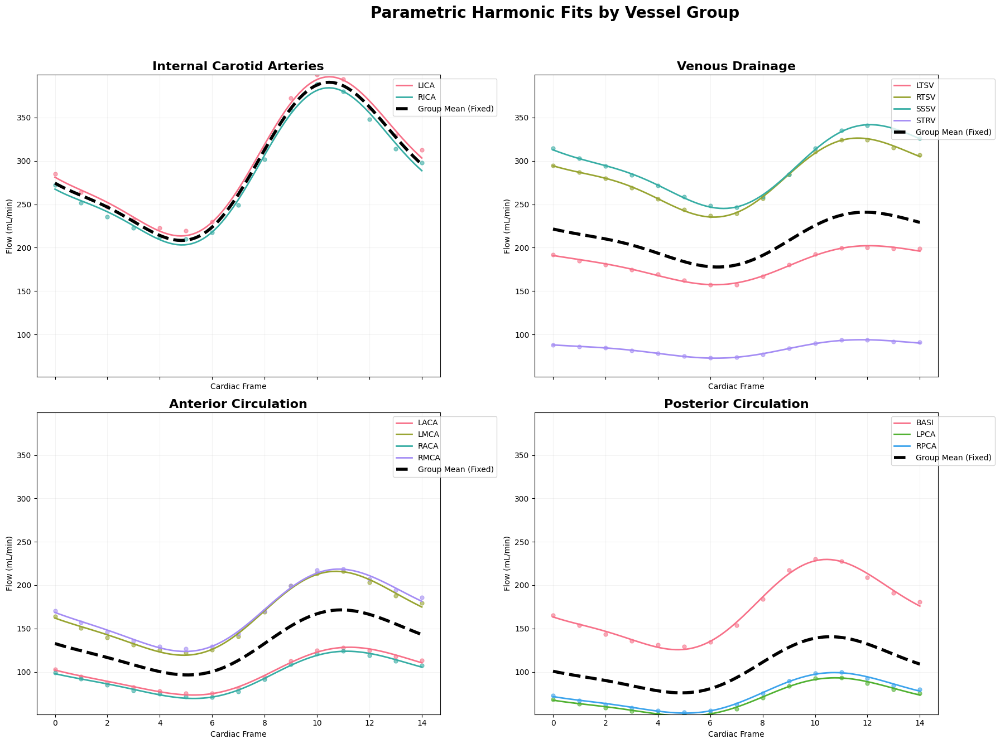

In [329]:
def plot_harmonic_group_fits(df, vessel_groups, frames_range=range(15)):
    """
    Plots Harmonic (Fourier) fits organized by anatomical vessel groups.
    Mimics the style of MixedLM conditional fits.
    """
    t_raw = np.array(list(frames_range))
    t_fine = np.linspace(min(t_raw), max(t_raw), 100)
    frame_cols = [c for c in df.columns if c.startswith('f') and c not in ['frame']]

    # Harmonic Model (A0=Mean, A1=Primary Pulse, A2=Higher order detail)
    def harmonic_func(t, A0, A1, phi1, A2, phi2):
        w = 2 * np.pi / max(t_raw + 1)
        return A0 + A1 * np.cos(w * t - phi1) + A2 * np.cos(2 * w * t - phi2)

    # Setup Subplots (2x2 grid based on your 4 groups)
    fig, axes = plt.subplots(2, 2, figsize=(20, 14), sharex=True)
    axes = axes.flatten()

    global_min, global_max = np.inf, -np.inf
    
    for ax, (group_name, vessels) in zip(axes, vessel_groups.items()):
        # Filter data for this group
        group_df = df[df['vessel_code'].isin(vessels)].copy()
        if group_df.empty:
            ax.set_title(f"{group_name} (No Data)")
            continue
            
        # Color palette for vessels within this subplot
        unique_vessels = group_df['vessel_code'].unique()
        palette = sns.color_palette("husl", n_colors=len(unique_vessels))
        vessel_colors = dict(zip(unique_vessels, palette))

        # 1. Fit and Plot Individual Vessels
        all_fits = [] # To calculate the group mean later
        
        for v_name in unique_vessels:
            v_data = group_df[group_df['vessel_code'] == v_name]
            
            # Aggregate if there are multiple subjects for the same vessel type
            # (Or iterate over patient_id if you want EVERY individual curve)
            y_mean = v_data[frame_cols].mean(axis=0).values
            
            # Fitting
            p0 = [np.mean(y_mean), (np.max(y_mean)-np.min(y_mean))/2, 3, (np.max(y_mean)-np.min(y_mean))/4, 1]
            try:
                popt, _ = curve_fit(harmonic_func, t_raw, y_mean, p0=p0, maxfev=5000)
                y_fit = harmonic_func(t_fine, *popt)
                all_fits.append(harmonic_func(t_fine, *popt))
                
                # Plot Raw Points
                ax.scatter(t_raw, y_mean, color=vessel_colors[v_name], s=25, alpha=0.6)
                # Plot Harmonic Line
                ax.plot(t_fine, y_fit, color=vessel_colors[v_name], linewidth=2, label=v_name)

                global_min = min(global_min, np.min(y_mean))
                global_max = max(global_max, np.max(y_mean))
            except Exception as e:
                import traceback
                traceback.print_exc()
                print(f"Could not fit {v_name}: {e}")

        # 2. Draw the "Fixed Effect" / Population Line for the Group
        if all_fits:
            group_population_mean = np.mean(all_fits, axis=0)
            ax.plot(t_fine, group_population_mean, color="black", linewidth=4, 
                    linestyle="--", label="Group Mean (Fixed)", zorder=10)

        # Formatting
        ax.set_title(group_name, fontsize=16, fontweight="bold")
        ax.set_xlabel("Cardiac Frame")
        ax.set_ylabel("Flow (mL/min)")
        ax.grid(True, alpha=0.15)
        ax.legend(loc='upper right', bbox_to_anchor=(1.15, 1.0))

    print(global_min, global_max)
    for ax in axes:
        ax.set_ylim(global_min, global_max)

    fig.suptitle("Parametric Harmonic Fits by Vessel Group", fontsize=20, fontweight="bold", y=0.98)
    plt.tight_layout(rect=[0, 0.03, 0.9, 0.95])
    return fig

fig = plot_harmonic_group_fits(flow_ts_wide, VESSEL_GROUPS_ORDER_BY_CODE)
fig.show()
df_parametric_population